# 0. Problem statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn, and identify the main indicators of churn.

In this competition, your goal is *to build a machine learning model that is able to predict churning customers based on the features provided for their usage.*

**Customer behaviour during churn:**

Customers usually do not decide to switch to another competitor instantly, but rather over a
period of time (this is especially applicable to high-value customers). In churn prediction, we
assume that there are three phases of customer lifecycle :

1. <u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

2. <u>The ‘action’ phase:</u> The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. <u>The ‘churn’ phase:</u> In this phase, the customer is said to have churned. In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

**Evaluation**
<br>**Goal**
<br>It is your job to predict if a customer will churn, given the ~170 columns containing customer behavior, usage patterns, payment patterns, and other features that might be relevant. Your target variable is "churn_probability"

**Metric**
<br>Submissions are evaluated on Classification Accuracy between the value of the predicted value and the actual value of churn for each of the customers.

**Accuracy score formula**

<br>The public leaderboard is going to rank your submission against other users while the competition is active, however, once the competition is ended, the final ranks will be calculated on the private leaderboard.

**Submission file format**
<br>The file should contain a header and have the following format (CSV):

**id,churn_probability**
<br>70005,0.0
<br>70006,1.0
<br>70007,0.0
<br>etc.


# Summary of Steps :
1. Import Necessary Libraries
2. Load the Data and Understand the Data
    - <i>Segment the columns- </i>
    - <i>Check for missing values</i>
    - <i>Apply Simple and KNN Imputation</i>
    - <i>Derive new features</i>
    - <i>Handle outliers</i>
3. Exploratory Data Analysis (EDA)
    - <i>Univariate analysis (one variable at a time)</i>
    - <i>Bivariate analysis (two variables at a time)</i>
    - <i>Multivariate analysis (more than two variables at a time)</i>
4. Data Preprocessing and Preparation
    - <i>Address data imbalance and apply SMOTE</i>
    - <i>Train-Test Split : Splitting the Data into Training and Testing Sets</i>
    - <i>Feature Scaling : Standard scaling </i>
    - <i>Perform dimensionality reduction and visualization using PCA and t-SNE</i>
5. Build Different Models
    - Train models such as Logistic Regression, Decision Tree, and Random Forest on the training set
6. Evaluate the Models
    - Assess accuracy, precision, recall, ROC and finding a cut off value on the training set
    - Make Predictions on Test Set
7. Identify the Best estimator and build the Model
    - Create a pipeline of the best model on the training set
    - Analyze Results of the best Model
    - Check metrics on both the training and test sets
8. Make Predictions on Unseen Data
9. Create the output and submission file

# 1. Import Necessary Libraries

In [278]:
#Data Structures
import pandas as pd
import numpy as np
import re
import os
import missingno as msno

#Time
import time
from datetime import datetime


#Sklearn
from sklearn.impute import SimpleImputer , KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,KFold,GridSearchCV,cross_val_score
from sklearn.feature_selection import RFE
from sklearn.decomposition import PCA , IncrementalPCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier , export_graphviz
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, classification_report,roc_auc_score,roc_curve

#Plotting
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
from IPython.display import Image
from six import StringIO
import pydotplus,graphviz

# imblearn
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline,make_pipeline

#Six
from six import StringIO  

#Others
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [279]:
# Log Start time
notebook_start_time = time.time()
print("Execution Start Time : " , datetime.now())

Execution Start Time :  2024-09-11 03:21:18.513537


# 2. Load the Data and Understand the Data

In [280]:
#COMMENT THIS SECTION INCASE RUNNING THIS NOTEBOOK LOCALLY

#Checking the kaggle paths for the uploaded datasets
# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

In [281]:
#INCASE RUNNING THIS LOCALLY, PASS THE RELATIVE PATH OF THE CSV FILES BELOW
#(e.g. if files are in same folder as notebook, simple write "train.csv" as path)

#churn_data = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-c-63/train.csv")
#churn_data_unseen = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-c-63/test.csv")
#sample = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-c-63/sample.csv")
#data_dict = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-c-63/data_dictionary.csv")

In [282]:
### Load and read data
churn_data = pd.read_csv("train.csv")
churn_data_unseen = pd.read_csv("test.csv")
sample = pd.read_csv("sample.csv")
data_dict = pd.read_csv("data_dictionary.csv")

print(churn_data.shape)
print(churn_data_unseen.shape)
print(sample.shape)
print(data_dict.shape)

(69999, 172)
(30000, 171)
(30000, 2)
(36, 2)


In [283]:
churn_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,...,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,...,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,60.806,103.176,...,0,0,NaN,NaN,NaN,882,0.0,0.0,0.0,0
3,3,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,156.362,205.260,...,0,0,NaN,NaN,NaN,982,0.0,0.0,0.0,0
4,4,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,240.708,128.191,...,1,0,1.0,1.0,1.0,647,0.0,0.0,0.0,0


In [284]:
churn_data_unseen.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,...,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,...,0,0,0,NaN,NaN,NaN,2533,0.00,0.00,0.00
2,70001,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,329.844,434.884,...,0,0,0,NaN,NaN,NaN,277,525.61,758.41,241.84
3,70002,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,43.550,171.390,...,0,0,0,NaN,NaN,NaN,1244,0.00,0.00,0.00
4,70003,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,306.854,406.289,...,0,0,0,NaN,NaN,NaN,462,0.00,0.00,0.00


### Info of datasets

In [285]:
churn_data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [286]:
churn_data_unseen.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 171 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

### Basic summary statistics

In [287]:
churn_data.describe(include="all")

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999,69600,69266,69999.000000,69999.000000,...,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000,69999.000000,69999.00000,69999.000000
unique,NaN,NaN,NaN,NaN,NaN,1,1,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,6/30/2014,7/31/2014,8/31/2014,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,69999,69600,69266,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,34999.000000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,283.134365,278.185912,...,0.081444,0.085487,0.916325,0.909544,0.890319,1220.639709,68.108597,65.935830,60.07674,0.101887
std,20207.115084,0.0,0.0,0.0,0.0,NaN,NaN,NaN,334.213918,344.366927,...,0.634547,0.680035,0.276907,0.286842,0.312501,952.426321,269.328659,267.899034,257.22681,0.302502
min,0.000000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,-2258.709000,-1289.715000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.00000,0.000000
25%,17499.500000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,93.581000,86.714000,...,0.000000,0.000000,1.000000,1.000000,1.000000,468.000000,0.000000,0.000000,0.00000,0.000000
50%,34999.000000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,197.484000,191.588000,...,0.000000,0.000000,1.000000,1.000000,1.000000,868.000000,0.000000,0.000000,0.00000,0.000000
75%,52498.500000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,370.791000,365.369500,...,0.000000,0.000000,1.000000,1.000000,1.000000,1813.000000,0.000000,0.000000,0.00000,0.000000


In [288]:
churn_data_unseen.describe(include="all")

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
count,30000.000000,30000.0,29684.0,29684.0,29684.0,30000,29798,29633,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,7585.000000,7706.000000,7922.000000,30000.000000,30000.000000,30000.000000,30000.000000
unique,NaN,NaN,NaN,NaN,NaN,1,1,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,6/30/2014,7/31/2014,8/31/2014,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,30000,29798,29633,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,84998.500000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,282.644348,279.355021,...,0.073467,0.077967,0.082200,0.909954,0.906956,0.891946,1218.023200,68.314097,68.946576,59.891621
std,8660.398374,0.0,0.0,0.0,0.0,NaN,NaN,NaN,314.560212,323.205370,...,0.557327,0.613596,0.611546,0.286267,0.290513,0.310468,960.109844,263.460641,278.749349,246.098292
min,69999.000000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,-185.043000,-2014.045000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000
25%,77498.750000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,92.907500,87.504750,...,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,466.000000,0.000000,0.000000,0.000000
50%,84998.500000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,198.227500,191.775000,...,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,853.000000,0.000000,0.000000,0.000000
75%,92498.250000,109.0,0.0,0.0,0.0,NaN,NaN,NaN,371.969250,365.250750,...,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1795.000000,0.000000,0.000000,0.000000


## Some custom defined functions

In [289]:
# Define a function to rename columns based on regex patterns
def rename_columns(col_name):
    # Patterns and replacements
    patterns = {
        r'_6$': '_jun',
        r'_7$': '_jul',
        r'_8$': '_aug'
    }
    
    for pattern, replacement in patterns.items():
        if re.search(pattern, col_name):
            return re.sub(pattern, replacement, col_name)
    return col_name

In [290]:
# Define a function to rename columns based on regex patterns
def rename_columns2(col_name):
    # Define replacements for prefixes
    if col_name.startswith('jun_'):
        return re.sub(r'^jun_', '', col_name) + '_jun'
    elif col_name.startswith('jul_'):
        return re.sub(r'^jul_', '', col_name) + '_jul'
    elif col_name.startswith('aug_'):
        return re.sub(r'^aug_', '', col_name) + '_aug'
    else:
        return col_name

In [291]:
# Function to check if a column has the same value in all rows
def is_column_constant_custom(df, cols , val=1):
    return df[cols].apply(lambda x: x.dropna().nunique() <= val and x.notna().all())

# Print the number of columns in the training set where all values are the same
constant_cols_train = churn_data.columns[is_column_constant_custom(churn_data, churn_data.columns)]
print("Seen Set: Number of columns where all values are the same:", len(constant_cols_train))
print("Columns with constant values in Seen Set:", constant_cols_train.tolist())
# Separator line
print("="*120)
# Print the number of columns in the test set where all values are the same
constant_cols_test = churn_data_unseen.columns[is_column_constant_custom(churn_data_unseen, churn_data_unseen.columns)]
print("Unseen Set: Number of columns where all values are the same:", len(constant_cols_test))
print("Columns with constant values in Unseen Set:", constant_cols_test.tolist())

Seen Set: Number of columns where all values are the same: 2
Columns with constant values in Seen Set: ['circle_id', 'last_date_of_month_6']
Unseen Set: Number of columns where all values are the same: 2
Columns with constant values in Unseen Set: ['circle_id', 'last_date_of_month_6']


In [292]:
def findCustomColumnTypes(df, search_type='all_search', target_column=None, include_all=False,  keyword=None, cut_off_val=7):
    """
    Finds and returns column names in a DataFrame based on various types and patterns.
    
    Parameters:
    - df: pandas DataFrame
      The DataFrame in which to search for column names.
    
    - search_type: string, optional, default='all_search'
      Specifies the type of search to perform. Can be one of:
        - 'all_search': Search across all specified types.
        - 'date_text': Search for columns with 'date' in their names.
        - 'object_type': Search for columns with object data types.
        - 'datetime': Search for columns with datetime data types.
        - 'numerical': Search for columns with numerical data types.
        - 'categorical': Search for columns with categorical features.
      
    - include_all: boolean, optional, default=False
      If True, includes all column names in the result under the key 'all_columns'.
    
    - keyword: string, optional
      A custom string pattern to match in column names. If provided, and if 
      `search_type` matches this key, the function will return columns that match the pattern.

    - target_column: string, optional
      A column name to be excluded from the results, if present. This will be removed from 
      lists of columns for each search type where applicable.

    Returns:
    - result: dict
      A dictionary containing lists of column names based on the search type.
      The keys of the dictionary will be:
        - 'all_columns': List of all columns (if `include_all=True`).
        - 'date_text_columns': Columns containing 'date' in their names.
        - 'object_type_columns': Columns with object data types.
        - 'datetime_columns': Columns with datetime data types.
        - 'numerical_columns': Columns with numerical data types.
        - 'categorical_columns': Columns identified as categorical.
        - '{key}_columns': Columns matching the custom `key` pattern (if provided).
    """
    
    # List all column names in the DataFrame
    all_columns = sorted(list(df.columns))
    result = {}
    
    # Include all columns if specified
    if include_all:
        result['all_columns'] = all_columns

    # Search for columns containing 'date' in their names
    if search_type == 'all_search' or search_type == 'date_text' or search_type == 'categorical':
        pattern = re.compile(r'date', re.IGNORECASE)
        date_text_columns = sorted([col for col in all_columns if pattern.search(col)])
        # Remove target_column from date_text_columns if it exists
        if target_column in date_text_columns:
            date_text_columns.remove(target_column)
        result['date_text_columns'] = date_text_columns
    
    # Search for columns with object data types
    if search_type == 'all_search' or search_type == 'object_type' or search_type == 'categorical':
        object_type_columns = sorted(list(df.select_dtypes(include=['object']).columns))
        # Remove target_column from object_type_columns if it exists
        if target_column in object_type_columns:
            object_type_columns.remove(target_column)
        result['object_type_columns'] = object_type_columns
    
    # Search for columns with datetime data types
    if search_type == 'all_search' or search_type == 'datetime' or search_type == 'categorical':
        datetime_columns = sorted(list(df.select_dtypes(include=['datetime64[ns]', '<M8[ns]']).columns))
        # Remove target_column from datetime_columns if it exists
        if target_column in datetime_columns:
            datetime_columns.remove(target_column)
        result['datetime_columns'] = datetime_columns
    
    # Search for numerical columns
    if search_type == 'all_search' or search_type == 'numerical' or search_type == 'categorical':
        numerical_columns = sorted(list(df.select_dtypes(include=['int64', 'float64']).columns))
        # Remove target_column from numerical_columns if it exists
        if target_column in numerical_columns:
            numerical_columns.remove(target_column)
        result['numerical_columns'] = numerical_columns
    
    # Search for categorical columns based on unique values
    if search_type == 'all_search' or search_type == 'categorical':
        constant_cols_train = df.columns[is_column_constant_custom(df, df.columns, cut_off_val)]
        categorical_columns = sorted(list(df.select_dtypes(include=['category']).columns))
        # Remove target_column from categorical_columns if it exists
        if target_column in categorical_columns:
            categorical_columns.remove(target_column)
        result['categorical_columns'] = categorical_columns
    
    # Search for custom key in column names
    if keyword:
        if search_type != 'all_search' or search_type == "key":
            pattern = re.compile(keyword, re.IGNORECASE)
            filtered_columns = sorted([col for col in all_columns if pattern.search(col)])
            # Remove target_column from filtered_columns if it exists
            if target_column in filtered_columns:
                filtered_columns.remove(target_column)
            # Sanitize the key to be used as a dictionary key
            safe_key = re.sub(r'\W+', '_', keyword)
            result[f'{safe_key}_columns'] = filtered_columns
    
    return result

In [293]:
def getMissingValues(data, missing_cutoff_value, dataset_type="Seen", vars_type="Numerical"):
    """
    Identify and print columns with missing values above a specified cutoff percentage.

    Parameters:
    data (DataFrame): The dataset to analyze.
    missing_cutoff_value (float): The cutoff percentage for missing values to filter columns.
    dataset_type (str): Type of dataset, e.g., "Seen" or "Unseen". Default is "Seen".
    vars_type (str): Type of variables, e.g., "Numerical" or "Categorical". Default is "Numerical".

    Returns:
    list: List of column names with missing values above the cutoff percentage.
    """
    # Calculate the percentage of missing values for each column
    missing_data = round(100 * data.isnull().mean())
    # Filter columns where missing values exceed the cutoff percentage and sort them in descending order
    missing_data_above_cutoff = missing_data[missing_data > missing_cutoff_value].sort_values(ascending=False)
    # Print the columns with missing values above the cutoff percentage
    print(f"----- {vars_type} variables of {dataset_type} dataset having missing values above cutoff value ({missing_cutoff_value}%) : -----\n{missing_data_above_cutoff}")
    # Find columns with missing values above the cutoff percentage
    missing_data_above_cutoff_cols = list(missing_data_above_cutoff.index)
    # Print the total number of columns with missing values above the cutoff and list of these columns
    print(f"Total number of {vars_type} variables of {dataset_type} dataset having missing values above cutoff value ({missing_cutoff_value}%) : {len(missing_data_above_cutoff_cols)}")
    #print(f"-----  {vars_type} variables of {dataset_type} dataset having missing values : -----\n{missing_data_above_cutoff_cols}")
    # Return the list of columns with missing values above the cutoff
    return missing_data_above_cutoff_cols

In [294]:
def simpleImputeMissingValues(data, data_unseen, cols, dec="constant", var=0):
    """
    Impute missing values in both training and test datasets.

    Parameters:
    data (DataFrame): The training dataset.
    data_unseen (DataFrame): The unseen (test) dataset.
    cols (list): List of column names to impute.
    dec (str): Imputation strategy. Options are 'constant', 'mean', 'median', etc.
    var (int, float, optional): Value to replace missing values with if `dec` is 'constant'. Default is 0.

    Returns:
    None: The function modifies the input DataFrames in place and prints the shapes of the datasets.
    """
    # Set up the imputer based on the chosen strategy
    if dec == "constant":
        imputer = SimpleImputer(strategy=dec, fill_value=var)
    else:
        imputer = SimpleImputer(strategy=dec)
    # Apply the imputer to the training dataset
    data[cols] = imputer.fit_transform(data[cols])
    # Apply the same imputer to the unseen (test) dataset
    data_unseen[cols] = imputer.transform(data_unseen[cols])
    # Print the shape of the DataFrame after imputation for the training set
    print("Seen Set Shape :- ", data.shape)
    # Separator line for clarity
    print("=" * 120)
    # Print the shape of the DataFrame after imputation for the test set
    print("Unseen Set Shape :- ", data_unseen.shape)

In [295]:
def knn_impute(data, data_unseen, columns, n_neighbors=5, sample_size=10000):
    """
    Perform KNN imputation on specified columns of both training and unseen data with an option to sample the data.
    
    Parameters:
    - data (pd.DataFrame): The training DataFrame with missing values.
    - data_unseen (pd.DataFrame): The unseen (test) DataFrame with missing values.
    - columns (list): List of column names to impute using KNN.
    - n_neighbors (int): Number of neighbors to use for KNN imputation (default is 5).
    - sample_size (int): Number of samples to use for fitting the KNN model (default is 10,000).
    """
    # Check if unseen data is provided
    if data_unseen is None:
        raise ValueError("Unseen data must be provided for imputation.")
    
    # Check if columns parameter is valid
    if not columns:
        raise ValueError("The 'columns' parameter must be provided and cannot be empty.")

    # Step 1: Check if specified columns exist in the DataFrame
    columns_to_impute = [col for col in columns if col in data.columns]
    
    if not columns_to_impute:
        raise ValueError("None of the specified columns were found in the training DataFrame.")
    
    # Step 2: Extract data for imputation
    data_to_impute = data[columns_to_impute]
    
    # Step 3: Scale the data
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data_to_impute)
    
    # Step 4: Apply KNN Imputation using a sample of the data
    if len(data) > sample_size:
        sample_indices = data.sample(n=sample_size, random_state=42).index
        sampled_data = scaled_data[sample_indices]
    else:
        sampled_data = scaled_data
    
    knn_imputer = KNNImputer(n_neighbors=n_neighbors)
    knn_imputer.fit(sampled_data)
    
    # Impute the full training data using the model trained on the sample
    imputed_data = knn_imputer.transform(scaled_data)
    
    # Step 5: Reverse scaling
    imputed_data = scaler.inverse_transform(imputed_data)
    
    # Step 6: Replace the original columns in the training DataFrame with imputed data
    data[columns_to_impute] = imputed_data
    
    # Print the shape of the DataFrame after imputation for the training set
    print("Seen Set Shape :- ", data.shape)
    # Separator line for clarity
    print("=" * 120)
    
    # Impute unseen data
    # Extract columns from unseen data that are present in training data
    common_columns = [col for col in columns_to_impute if col in data_unseen.columns]
    
    if common_columns:
        # Extract the unseen data for imputation
        unseen_data_to_impute = data_unseen[common_columns]
        
        # Scale the unseen data using the scaler fitted on the training data
        scaled_unseen_data = scaler.transform(unseen_data_to_impute)
        
        # Apply KNN Imputation using the imputer fitted on the sampled training data
        imputed_unseen_data = knn_imputer.transform(scaled_unseen_data)
        
        # Reverse scaling
        imputed_unseen_data = scaler.inverse_transform(imputed_unseen_data)
        
        # Replace the original columns in the unseen DataFrame with imputed data
        data_unseen[common_columns] = imputed_unseen_data
    
    # Print the shape of the DataFrame after imputation for the test set
    print("Unseen Set Shape :- ", data_unseen.shape)


In [296]:
def impute_rows(row, col1, col2, col3, val):
    """
    Impute missing values in a row based on specified conditions.

    Parameters:
    row (pd.Series): A row from the DataFrame.
    col1 (str): The name of the primary column.
    col2 (str): The name of the first secondary column.
    col3 (str): The name of the second secondary column.
    val: The value to impute if the columns are missing.

    Returns:
    pd.Series: The updated row with imputed values.
    """
    # Print the row ID
    print(f"Processing row with index {row.name}")
    
    # Check and handle col1
    if pd.isnull(row[col1]):
        print(f"Row {row.name}: {col1} is null. Imputing with value {val}.")
        row[col1] = val
    else:
        print(f"Row {row.name}: {col1} is already not null, value - {row[col1]}")
        
    # Check and handle col2
    if pd.notnull(row[col1]) and pd.isnull(row[col2]):
        print(f"Row {row.name}: {col2} is null. Imputing with {col1} value {row[col1]}.")
        row[col2] = row[col1]
    elif pd.isnull(row[col1]) and pd.isnull(row[col2]):
        print(f"Row {row.name}: Both {col1} and {col2} are null. Imputing {col2} with value {val}.")
        row[col2] = val
    else:
        print(f"Row {row.name}: {col2} is already not null, value - {row[col2]}")
        
    # Check and handle col3
    if pd.notnull(row[col1]) and pd.isnull(row[col2]) and pd.isnull(row[col3]):
        print(f"Row {row.name}: {col3} is null. Imputing with {col1} value {row[col1]}.")
        row[col3] = row[col1]
    elif pd.notnull(row[col2]) and pd.isnull(row[col3]):
        print(f"Row {row.name}: {col3} is null. Imputing with {col2} value {row[col2]}.")
        row[col3] = row[col2]
    elif pd.isnull(row[col1]) and pd.isnull(row[col2]) and pd.isnull(row[col3]):
        print(f"Row {row.name}: All three columns are null. Imputing {col3} with value {val}.")
        row[col3] = val
    else:
        print(f"Row {row.name}: {col3} is already not null, value - {row[col3]}")
        
    return row

In [297]:
def remove_outliers(df, cols, lower_quantile=0.10, upper_quantile=0.90, factor=1.5, max_row_loss=0.1, epsilon=1e-4):
    """
    Safely removes outliers from the specified numeric columns in the DataFrame based on the interquartile range method
    with additional checks for lower and upper percentile similarities to avoid excessive row loss.
    
    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - cols (list): List of column names in df to remove outliers from.
    - lower_quantile (float): The lower percentile threshold for the IQR method (default is 0.10).
    - upper_quantile (float): The upper percentile threshold for the IQR method (default is 0.90).
    - factor (float): The multiplier for the interquartile range to define outlier boundaries (default is 1.5).
    - max_row_loss (float): The maximum acceptable proportion of rows to lose after outlier removal (default is 0.1 or 10%).
    - epsilon (float): The threshold for considering percentiles as similar (default is 1e-4).
    
    Returns:
    - pd.DataFrame: The DataFrame with outliers removed in the specified columns.
    """
    
    for col in cols:
        # Calculate the lower (Q1) and upper (Q3) quantiles
        Q1 = df[col].quantile(lower_quantile)
        Q3 = df[col].quantile(upper_quantile)
        
        # Compute the Interquartile Range (IQR)
        IQR = Q3 - Q1
        
        # Define outlier bounds based on the IQR and factor
        lower_bound = Q1 - factor * IQR
        upper_bound = Q3 + factor * IQR
        
        # Check if lower percentiles (1st to 5th) are very close to each other
        lower_percentile_values = df[col].quantile([0.01, 0.02, 0.03, 0.04, 0.05])
        lower_percentile_diff = lower_percentile_values.diff().abs()
        
        # Check if upper percentiles (95th to 99th) are very close to each other
        upper_percentile_values = df[col].quantile([0.95, 0.96, 0.97, 0.98, 0.99])
        upper_percentile_diff = upper_percentile_values.diff().abs()
        
        # Skip outlier removal if either lower or upper percentiles are too similar
        if np.all(lower_percentile_diff < epsilon) or np.all(upper_percentile_diff < epsilon):
            print(f"Skipping column '{col}' due to similar lower or upper percentile values.")
            continue
        
        # Record the number of rows before outlier removal
        before_count = df.shape[0]
        
        # Apply outlier removal based on the calculated bounds
        df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
        
        # Record the number of rows after outlier removal
        after_count = df.shape[0]
        
        # Calculate the proportion of rows lost due to outlier removal
        row_loss = (before_count - after_count) / before_count
        
        # If row loss exceeds the specified threshold, revert the changes
        if row_loss > max_row_loss:
            print(f"Warning: Removing outliers in column '{col}' dropped {row_loss:.2%} of rows. Reverting changes.")
            df = df[(df[col] >= Q1 - factor * IQR) & (df[col] <= Q3 + factor * IQR)]  # Use less aggressive bounds
        else:
            print(f"Column '{col}' - Rows reduced from {before_count} to {after_count} after removing outliers.")
    
    return df

In [298]:
def remove_outliers2(df, numeric_cols, lower_quantile=0.10, upper_quantile=0.90, iqr_multiplier=1.5):
    """
    Removes outliers from the specified numeric columns in the DataFrame based on the interquartile range method.
    
    Parameters:
    - df (pd.DataFrame): The input DataFrame.
    - numeric_cols (list): List of column names in df to remove outliers from.
    - lower_quantile (float): The lower percentile threshold (default is 0.10).
    - upper_quantile (float): The upper percentile threshold (default is 0.90).
    - iqr_multiplier (float): The multiplier for the interquartile range to define outlier boundaries (default is 1.5).

    Returns:
    - pd.DataFrame: A new DataFrame with outliers removed.
    """
    filtered_df = df.copy()
    for col in numeric_cols:
        # Calculate the quantiles
        q1 = filtered_df[col].quantile(lower_quantile)
        q3 = filtered_df[col].quantile(upper_quantile)
        iqr = q3 - q1
        # Calculate the lower and upper bounds for outliers
        range_low = q1 - iqr_multiplier * iqr
        range_high = q3 + iqr_multiplier * iqr
        ### # Print the quantile boundaries for debugging
        ### print(f"Column: {col}")
        ### print(f"  10th Percentile (Q1): {q1}")
        ### print(f"  90th Percentile (Q3): {q3}")
        ### print(f"  IQR: {iqr}")
        ### print(f"  Lower Bound: {range_low}")
        ### print(f"  Upper Bound: {range_high}")
        # Filter the DataFrame
        filtered_df = filtered_df[(filtered_df[col] > range_low) & (filtered_df[col] < range_high)]
        # Print the shape after filtering
        print(f"Shape after filtering column {col}: {filtered_df.shape}")
    return filtered_df

### Let's replace columns suffixes _6, _7, and _8 with jun, jul, and aug, respectively, using regular expressions

In [299]:
# Apply the renaming function to all column names
churn_data.rename(columns=lambda x: rename_columns(x), inplace=True)
churn_data_unseen.rename(columns=lambda x: rename_columns(x), inplace=True)

### Looking at the data we can see that there are a few columns which do not have the proper naming convention where the month is appended in the end. Lets fix them.

In [300]:
# Apply the renaming function 2 to all column names
churn_data.rename(columns=lambda x: rename_columns2(x), inplace=True)
churn_data_unseen.rename(columns=lambda x: rename_columns2(x), inplace=True)

### Check duplicate records

In [301]:
churn_data[churn_data.duplicated()]

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_jun,last_date_of_month_jul,last_date_of_month_aug,arpu_jun,arpu_jul,...,sachet_3g_jul,sachet_3g_aug,fb_user_jun,fb_user_jul,fb_user_aug,aon,vbc_3g_aug,vbc_3g_jul,vbc_3g_jun,churn_probability


In [302]:
churn_data_unseen[churn_data_unseen.duplicated()]

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_jun,last_date_of_month_jul,last_date_of_month_aug,arpu_jun,arpu_jul,...,sachet_3g_jun,sachet_3g_jul,sachet_3g_aug,fb_user_jun,fb_user_jul,fb_user_aug,aon,vbc_3g_aug,vbc_3g_jul,vbc_3g_jun


### To check all rows in some particular columns are null. If all rows are null then we'll remove those rows or records

In [303]:
# Print the number of rows in the training set where all columns are missing
print("Seen Set: Rows with all columns missing:", churn_data[churn_data.isnull().all(axis=1)].shape[0])
# Separator line
print("="*120) 
# Print the number of rows in the test set where all columns are missing
print("Unseen Set: Rows with all columns missing:", churn_data_unseen[churn_data_unseen.isnull().all(axis=1)].shape[0])

Seen Set: Rows with all columns missing: 0
Unseen Set: Rows with all columns missing: 0


### Checking for Columns with Constant Values (Considering NaN as unique value) 

In [304]:
unique_cols=churn_data.columns[churn_data.nunique(dropna=True) == 1].tolist()

### Check summary statistics , mean , max of Unique columns

In [305]:
churn_data[unique_cols].describe()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,std_og_t2c_mou_jun,std_og_t2c_mou_jul,std_og_t2c_mou_aug,std_ic_t2o_mou_jun,std_ic_t2o_mou_jul,std_ic_t2o_mou_aug
count,69999.0,69297.0,69297.0,69297.0,67231.0,67312.0,66296.0,67231.0,67312.0,66296.0
mean,109.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,109.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,109.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,109.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,109.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,109.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [306]:
churn_data.drop(unique_cols,axis=1,inplace=True)
churn_data_unseen.drop(unique_cols,axis=1,inplace=True)

### Segmentation of Columns

In [307]:
target_col='churn_probability'

In [308]:
churn_data_columns=findCustomColumnTypes(df=churn_data, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)
churn_data_unseen_columns=findCustomColumnTypes(df=churn_data_unseen, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)

In [309]:
### Identify the object columns
print("------- Object Columns for Seen Set ------- \n",churn_data_columns["object_type_columns"])
# Separator line
print("="*120)
print("------- Object Columns for Unseen Set ------- \n",churn_data_unseen_columns["object_type_columns"])
# Separator line
print("="*120)
### Identify the numerical columns
print("------- Numerical Columns for Seen Set ------- \n",churn_data_columns["numerical_columns"])
# Separator line
print("="*120) 
print("------- Numerical Columns for Unseen Set ------- \n",churn_data_unseen_columns["numerical_columns"])
### Identify the Categorical columns
print("------- Categorical Columns for Seen Set ------- \n",churn_data_columns["categorical_columns"])
# Separator line
print("="*120) 
print("------- Categorical Columns for Unseen Set ------- \n",churn_data_unseen_columns["categorical_columns"])

------- Object Columns for Seen Set ------- 
 ['date_of_last_rech_aug', 'date_of_last_rech_data_aug', 'date_of_last_rech_data_jul', 'date_of_last_rech_data_jun', 'date_of_last_rech_jul', 'date_of_last_rech_jun']
------- Object Columns for Unseen Set ------- 
 ['date_of_last_rech_aug', 'date_of_last_rech_data_aug', 'date_of_last_rech_data_jul', 'date_of_last_rech_data_jun', 'date_of_last_rech_jul', 'date_of_last_rech_jun']
------- Numerical Columns for Seen Set ------- 
 ['aon', 'arpu_2g_aug', 'arpu_2g_jul', 'arpu_2g_jun', 'arpu_3g_aug', 'arpu_3g_jul', 'arpu_3g_jun', 'arpu_aug', 'arpu_jul', 'arpu_jun', 'av_rech_amt_data_aug', 'av_rech_amt_data_jul', 'av_rech_amt_data_jun', 'count_rech_2g_aug', 'count_rech_2g_jul', 'count_rech_2g_jun', 'count_rech_3g_aug', 'count_rech_3g_jul', 'count_rech_3g_jun', 'fb_user_aug', 'fb_user_jul', 'fb_user_jun', 'ic_others_aug', 'ic_others_jul', 'ic_others_jun', 'id', 'isd_ic_mou_aug', 'isd_ic_mou_jul', 'isd_ic_mou_jun', 'isd_og_mou_aug', 'isd_og_mou_jul', '

In [435]:
ids = ['id']
total_amounts = [i for i in list(churn_data.columns) if re.search('total.+amt',i)]
total_incoming_minutes = [i for i in list(churn_data.columns) if re.search('total.+ic.+mou',i)]
total_outgoing_minutes = [i for i in list(churn_data.columns) if re.search('total.+og.+mou',i)]
offnetwork_minutes = [i for i in list(churn_data.columns) if re.search('offnet',i)]
onnetwork_minutes = [i for i in list(churn_data.columns) if re.search('onnet',i)]
average_revenue_3g = [i for i in list(churn_data.columns) if re.search('arpu.+3g',i)]
average_revenue_2g = [i for i in list(churn_data.columns) if re.search('arpu.+2g',i)]
volume_3g = [i for i in list(churn_data.columns) if re.search('vol.+3g',i)]
volume_2g = [i for i in list(churn_data.columns) if re.search('vol.+2g',i)]
data_3g = [i for i in list(churn_data.columns) if re.search('3g',i) if i not in volume_3g if i not in average_revenue_3g]
data_2g = [i for i in list(churn_data.columns) if re.search('2g',i) if i not in volume_2g if i not in average_revenue_2g]
age_on_network = [i for i in list(churn_data.columns) if re.search('aon',i)]
arpu_cols = [i for i in list(churn_data.columns) if re.search('arpu',i)]
date_cols = [i for i in list(churn_data.columns) if re.search('date',i)]
day_cols = [i for i in list(churn_data.columns) if re.search('day',i)]
fb_cols = [i for i in list(churn_data.columns) if re.search('fb.+user',i)]
night_pack_cols = [i for i in list(churn_data.columns) if re.search('night.+pck.+user',i)]
recharge_cols=[i for i in list(churn_data.columns) if re.search('(rch_amt|rech_amt|rech_data)',i)]
incoming_minutes = [i for i in list(churn_data.columns) if re.search('ic',i) if i not in total_incoming_minutes]
outgoing_minutes = [i for i in list(churn_data.columns) if re.search('og',i) if i not in total_outgoing_minutes]

### Date Columns

In [311]:
churn_data[date_cols].head()

,date_of_last_rech_jun,date_of_last_rech_jul,date_of_last_rech_aug,date_of_last_rech_data_jun,date_of_last_rech_data_jul,date_of_last_rech_data_aug
0,6/22/2014,7/10/2014,8/24/2014,NaN,NaN,NaN
1,6/12/2014,7/10/2014,8/26/2014,NaN,7/8/2014,NaN
2,6/11/2014,7/22/2014,8/24/2014,NaN,NaN,NaN
3,6/15/2014,7/21/2014,8/25/2014,NaN,NaN,NaN
4,6/25/2014,7/26/2014,8/30/2014,6/25/2014,7/23/2014,8/20/2014


#### Missing Value Check

In [312]:
## Lets check the columns with missing values
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data[date_cols],cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data[date_cols],cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
date_of_last_rech_data_jun    75.0
date_of_last_rech_data_jul    74.0
date_of_last_rech_data_aug    74.0
date_of_last_rech_aug          4.0
date_of_last_rech_jun          2.0
date_of_last_rech_jul          2.0
dtype: float64
Total number of Numerical variables of Seen dataset having missing values above cutoff value (0%) : 6
----- Numerical variables of Unseen dataset having missing values above cutoff value (0%) : -----
date_of_last_rech_data_jun    75.0
date_of_last_rech_data_jul    74.0
date_of_last_rech_data_aug    74.0
date_of_last_rech_aug          4.0
date_of_last_rech_jun          2.0
date_of_last_rech_jul          2.0
dtype: float64
Total number of Numerical variables of Unseen dataset having missing values above cutoff value (0%) : 6


#### Imputation

In [313]:
# Drop these columns
churn_data.drop(date_cols,axis=1,inplace=True)
churn_data_unseen.drop(date_cols,axis=1,inplace=True)

### Day Columns

In [314]:
churn_data[day_cols].head()

,last_day_rch_amt_jun,last_day_rch_amt_jul,last_day_rch_amt_aug
0,65,65,0
1,0,0,0
2,70,50,0
3,110,110,50
4,25,10,30


#### Missing Value Check

In [315]:
## Lets check the columns with missing values
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data[day_cols],cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data[day_cols],cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
Series([], dtype: float64)
Total number of Numerical variables of Seen dataset having missing values above cutoff value (0%) : 0
----- Numerical variables of Unseen dataset having missing values above cutoff value (0%) : -----
Series([], dtype: float64)
Total number of Numerical variables of Unseen dataset having missing values above cutoff value (0%) : 0


### ARPU Columns

In [316]:
arpu_cols = [i for i in list(churn_data.columns) if re.search('arpu',i)]
average_revenue_3g = [i for i in list(churn_data.columns) if re.search('arpu.+3g',i)]
average_revenue_2g = [i for i in list(churn_data.columns) if re.search('arpu.+2g',i)]

#### Missing Value Check

In [317]:
## Lets check the columns with missing values
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data[arpu_cols],cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data[arpu_cols],cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
arpu_3g_jun    75.0
arpu_2g_jun    75.0
arpu_3g_jul    74.0
arpu_3g_aug    74.0
arpu_2g_jul    74.0
arpu_2g_aug    74.0
dtype: float64
Total number of Numerical variables of Seen dataset having missing values above cutoff value (0%) : 6
----- Numerical variables of Unseen dataset having missing values above cutoff value (0%) : -----
arpu_3g_jun    75.0
arpu_2g_jun    75.0
arpu_3g_jul    74.0
arpu_3g_aug    74.0
arpu_2g_jul    74.0
arpu_2g_aug    74.0
dtype: float64
Total number of Numerical variables of Unseen dataset having missing values above cutoff value (0%) : 6


#### Imputation

In [318]:
# missing_values_cols contains the columns to impute
imputeCols = missing_values_cols_seen
# Set up the imputer to replace missing values with 0
simpleImputeMissingValues(churn_data, churn_data_unseen, imputeCols, dec="constant", var=0)

Seen Set Shape :-  (69999, 153)
Unseen Set Shape :-  (30000, 152)


### Recharge Columns

In [319]:
total_recharge_amount_cols = [i for i in list(churn_data.columns) if re.search('total.+(rch|rech|rec).+amt',i)]
total_recharge_data_cols = [i for i in list(churn_data.columns) if re.search('total.+(rch|rech|rec).+data',i)]
av_recharge_amount_cols = [i for i in list(churn_data.columns) if re.search('av.+(rch|rech|rec).+amt',i)]
av_recharge_data_cols = [i for i in list(churn_data.columns) if re.search('av.+(rch|rech|rec).+data',i)]
max_recharge_amount_cols = [i for i in list(churn_data.columns) if re.search('max.+(rch|rech|rec).+amt',i)]
max_recharge_data_cols = [i for i in list(churn_data.columns) if re.search('max.+(rch|rech|rec).+data',i)]

#### Missing Value Check

In [320]:
variables = [*total_recharge_amount_cols, 
             *total_recharge_data_cols,
             *av_recharge_amount_cols,
             *av_recharge_data_cols,
             *max_recharge_amount_cols,
             *max_recharge_data_cols]

In [321]:
## Lets check the columns with missing values
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data[variables],cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data[variables],cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
total_rech_data_jun     75.0
av_rech_amt_data_jun    75.0
av_rech_amt_data_jun    75.0
max_rech_data_jun       75.0
total_rech_data_jul     74.0
total_rech_data_aug     74.0
av_rech_amt_data_jul    74.0
av_rech_amt_data_aug    74.0
av_rech_amt_data_jul    74.0
av_rech_amt_data_aug    74.0
max_rech_data_jul       74.0
max_rech_data_aug       74.0
dtype: float64
Total number of Numerical variables of Seen dataset having missing values above cutoff value (0%) : 12
----- Numerical variables of Unseen dataset having missing values above cutoff value (0%) : -----
total_rech_data_jun     75.0
av_rech_amt_data_jun    75.0
av_rech_amt_data_jun    75.0
max_rech_data_jun       75.0
total_rech_data_jul     74.0
total_rech_data_aug     74.0
av_rech_amt_data_jul    74.0
av_rech_amt_data_aug    74.0
av_rech_amt_data_jul    74.0
av_rech_amt_data_aug    74.0
max_rech_data_jul       74.0
max_rech_data_aug    

#### Imputation

In [322]:
# missing_values_cols contains the columns to impute
imputeCols = missing_values_cols_seen
# Set up the imputer to replace missing values with 0
simpleImputeMissingValues(churn_data, churn_data_unseen, imputeCols, dec="constant", var=0)

Seen Set Shape :-  (69999, 153)
Unseen Set Shape :-  (30000, 152)


### Incoming Minutes Columns

In [323]:
churn_data[incoming_minutes].head()

,roam_ic_mou_jun,roam_ic_mou_jul,roam_ic_mou_aug,loc_ic_t2t_mou_jun,loc_ic_t2t_mou_jul,loc_ic_t2t_mou_aug,loc_ic_t2m_mou_jun,loc_ic_t2m_mou_jul,loc_ic_t2m_mou_aug,loc_ic_t2f_mou_jun,...,std_ic_mou_aug,spl_ic_mou_jun,spl_ic_mou_jul,spl_ic_mou_aug,isd_ic_mou_jun,isd_ic_mou_jul,isd_ic_mou_aug,ic_others_jun,ic_others_jul,ic_others_aug
0,0.00,0.0,0.0,2.43,3.68,7.79,0.83,21.08,16.91,0.00,...,15.18,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00
1,0.00,0.0,0.0,1.68,19.09,10.53,1.41,18.68,11.09,0.35,...,0.00,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00
2,0.00,0.0,0.0,4.51,6.16,6.49,89.86,25.18,23.51,0.00,...,6.38,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25
3,0.00,0.0,0.0,24.98,4.84,23.88,53.99,44.23,57.14,7.23,...,2.81,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00
4,53.64,0.0,0.0,5.44,1.39,2.66,10.58,4.33,19.49,5.51,...,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00


#### Missing Value Check

In [324]:
## Lets check the columns with missing values
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data[incoming_minutes],cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data[incoming_minutes],cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
ic_others_aug         5.0
loc_ic_t2m_mou_aug    5.0
std_ic_t2f_mou_aug    5.0
std_ic_t2t_mou_aug    5.0
std_ic_mou_aug        5.0
loc_ic_mou_aug        5.0
loc_ic_t2f_mou_aug    5.0
spl_ic_mou_aug        5.0
isd_ic_mou_aug        5.0
loc_ic_t2t_mou_aug    5.0
roam_ic_mou_aug       5.0
std_ic_t2m_mou_aug    5.0
isd_ic_mou_jul        4.0
isd_ic_mou_jun        4.0
std_ic_t2f_mou_jul    4.0
spl_ic_mou_jul        4.0
spl_ic_mou_jun        4.0
ic_others_jun         4.0
std_ic_mou_jul        4.0
ic_others_jul         4.0
std_ic_mou_jun        4.0
roam_ic_mou_jun       4.0
std_ic_t2f_mou_jun    4.0
std_ic_t2m_mou_jul    4.0
roam_ic_mou_jul       4.0
std_ic_t2t_mou_jul    4.0
std_ic_t2t_mou_jun    4.0
loc_ic_mou_jul        4.0
loc_ic_mou_jun        4.0
loc_ic_t2f_mou_jul    4.0
loc_ic_t2f_mou_jun    4.0
loc_ic_t2m_mou_jul    4.0
loc_ic_t2m_mou_jun    4.0
loc_ic_t2t_mou_jul    4.0
loc_ic_t2t_mou_jun  

#### Imputation

In [325]:
# Start time
start_time = time.time()
print("Execution Start Time : " , datetime.now())
# missing_values_cols contains the columns to impute
imputeCols = missing_values_cols_seen
# Set up the KNN imputer to replace missing values of certain columns
knn_impute(data=churn_data, data_unseen=churn_data_unseen, columns=imputeCols, n_neighbors=5,sample_size=10000)
# End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-11 03:21:23.697135
Seen Set Shape :-  (69999, 153)
Unseen Set Shape :-  (30000, 152)
Execution End Time :  2024-09-11 03:22:09.430261
Execution time: 45.73312568664551 seconds


### Outgoing Minutes Columns

In [326]:
churn_data[outgoing_minutes].head()

,roam_og_mou_jun,roam_og_mou_jul,roam_og_mou_aug,loc_og_t2t_mou_jun,loc_og_t2t_mou_jul,loc_og_t2t_mou_aug,loc_og_t2m_mou_jun,loc_og_t2m_mou_jul,loc_og_t2m_mou_aug,loc_og_t2f_mou_jun,...,std_og_mou_aug,isd_og_mou_jun,isd_og_mou_jul,isd_og_mou_aug,spl_og_mou_jun,spl_og_mou_jul,spl_og_mou_aug,og_others_jun,og_others_jul,og_others_aug
0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,...,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0
1,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0
2,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,...,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0
3,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,...,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,0.0
4,15.73,0.0,0.00,10.16,4.83,6.13,36.74,19.88,4.61,11.99,...,0.00,0.0,0.0,0.0,0.00,17.00,0.00,0.00,0.0,0.0


#### Missing Value Check

In [327]:
## Lets check the columns with missing values
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data[outgoing_minutes],cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data[outgoing_minutes],cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
og_others_aug         5.0
isd_og_mou_aug        5.0
std_og_t2t_mou_aug    5.0
std_og_t2f_mou_aug    5.0
loc_og_mou_aug        5.0
std_og_mou_aug        5.0
loc_og_t2c_mou_aug    5.0
std_og_t2m_mou_aug    5.0
loc_og_t2f_mou_aug    5.0
loc_og_t2m_mou_aug    5.0
spl_og_mou_aug        5.0
loc_og_t2t_mou_aug    5.0
roam_og_mou_aug       5.0
spl_og_mou_jun        4.0
spl_og_mou_jul        4.0
isd_og_mou_jul        4.0
isd_og_mou_jun        4.0
std_og_mou_jul        4.0
og_others_jun         4.0
std_og_mou_jun        4.0
og_others_jul         4.0
std_og_t2f_mou_jul    4.0
std_og_t2f_mou_jun    4.0
roam_og_mou_jun       4.0
std_og_t2m_mou_jul    4.0
std_og_t2m_mou_jun    4.0
roam_og_mou_jul       4.0
std_og_t2t_mou_jun    4.0
loc_og_mou_jul        4.0
loc_og_mou_jun        4.0
loc_og_t2c_mou_jul    4.0
loc_og_t2c_mou_jun    4.0
loc_og_t2f_mou_jul    4.0
loc_og_t2f_mou_jun    4.0
loc_og_t2m_mou_jul  

#### Imputation

In [328]:
# Start time
start_time = time.time()
print("Execution Start Time : " , datetime.now())
# missing_values_cols contains the columns to impute
imputeCols = missing_values_cols_seen
# Set up the KNN imputer to replace missing values of certain columns
knn_impute(data=churn_data, data_unseen=churn_data_unseen, columns=imputeCols, n_neighbors=5,sample_size=10000)
# End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-11 03:22:09.512142
Seen Set Shape :-  (69999, 153)
Unseen Set Shape :-  (30000, 152)
Execution End Time :  2024-09-11 03:22:58.817511
Execution time: 49.305368185043335 seconds


## Data 2g 3g Columns

In [437]:
churn_data[data_2g+data_3g].head()

,count_rech_2g_jun,count_rech_2g_jul,count_rech_2g_aug,monthly_2g_jun,monthly_2g_jul,monthly_2g_aug,sachet_2g_jun,sachet_2g_jul,sachet_2g_aug,count_rech_3g_jun,...,count_rech_3g_aug,monthly_3g_jun,monthly_3g_jul,monthly_3g_aug,sachet_3g_jun,sachet_3g_jul,sachet_3g_aug,vbc_3g_aug,vbc_3g_jul,vbc_3g_jun
0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,...,0.0,0,0,0,0,0,0,0.00,0.00,0.00
1,0.0,0.0,0.0,0,0,0,0,0,0,0.0,...,0.0,0,0,0,0,0,0,0.00,0.00,0.00
2,0.0,0.0,0.0,0,0,0,0,0,0,0.0,...,0.0,0,0,0,0,0,0,525.61,758.41,241.84
3,0.0,0.0,0.0,0,0,0,0,0,0,0.0,...,0.0,0,0,0,0,0,0,0.00,0.00,0.00
4,0.0,0.0,0.0,0,0,0,0,0,0,0.0,...,0.0,0,0,0,0,0,0,0.00,0.00,0.00


#### Missing Value Check

In [438]:
## Lets check the columns with missing values
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data,cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data,cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
Series([], dtype: float64)
Total number of Numerical variables of Seen dataset having missing values above cutoff value (0%) : 0
----- Numerical variables of Unseen dataset having missing values above cutoff value (0%) : -----
Series([], dtype: float64)
Total number of Numerical variables of Unseen dataset having missing values above cutoff value (0%) : 0


#### Imputation

In [428]:
# missing_values_cols contains the columns to impute
imputeCols = missing_values_cols_seen
# Set up the imputer to replace missing values with 0
simpleImputeMissingValues(churn_data, churn_data_unseen, imputeCols, dec="constant", var=0)

Seen Set Shape :-  (22825, 146)
Unseen Set Shape :-  (30000, 140)


### Other Columns like FB User , Night Pack etc

In [329]:
fb_cols = [i for i in list(churn_data.columns) if re.search('fb.+user',i)]
night_pack_cols = [i for i in list(churn_data.columns) if re.search('night.+pck.+user',i)]

In [330]:
churn_data[fb_cols+night_pack_cols].head()

,fb_user_jun,fb_user_jul,fb_user_aug,night_pck_user_jun,night_pck_user_jul,night_pck_user_aug
0,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,1.0,NaN,NaN,0.0,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN
4,1.0,1.0,1.0,0.0,0.0,0.0


#### Missing Value Check

In [331]:
## Lets check the columns with missing values
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data[fb_cols+night_pack_cols],cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data[fb_cols+night_pack_cols],cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
fb_user_jun           75.0
night_pck_user_jun    75.0
fb_user_jul           74.0
fb_user_aug           74.0
night_pck_user_jul    74.0
night_pck_user_aug    74.0
dtype: float64
Total number of Numerical variables of Seen dataset having missing values above cutoff value (0%) : 6
----- Numerical variables of Unseen dataset having missing values above cutoff value (0%) : -----
fb_user_jun           75.0
night_pck_user_jun    75.0
fb_user_jul           74.0
fb_user_aug           74.0
night_pck_user_jul    74.0
night_pck_user_aug    74.0
dtype: float64
Total number of Numerical variables of Unseen dataset having missing values above cutoff value (0%) : 6


#### Imputation

In [332]:
# missing_values_cols contains the columns to impute
imputeCols = missing_values_cols_seen
# Set up the imputer to replace missing values with 0
simpleImputeMissingValues(churn_data, churn_data_unseen, imputeCols, dec="constant", var=0)

Seen Set Shape :-  (69999, 153)
Unseen Set Shape :-  (30000, 152)


In [333]:
# Convert to`category` data type.
churn_data[fb_cols+night_pack_cols] = churn_data[fb_cols+night_pack_cols].astype('category')
churn_data_unseen[fb_cols+night_pack_cols] = churn_data_unseen[fb_cols+night_pack_cols].astype('category')

### Target Variable

In [334]:
churn_data[target_col].info()

<class 'pandas.core.series.Series'>
RangeIndex: 69999 entries, 0 to 69998
Series name: churn_probability
Non-Null Count  Dtype
--------------  -----
69999 non-null  int64
dtypes: int64(1)
memory usage: 547.0 KB


In [335]:
churn_data[target_col]=churn_data[target_col].astype('category')

In [336]:
# Check data imbalance in the target column i.e., 'churn_probability' column of the churn_data_high DataFrame
round ( 100 * churn_data[target_col].value_counts(normalize=True) , 2)

churn_probability
0    89.81
1    10.19
Name: proportion, dtype: float64

#### The proportions are as follows:
 - Almost 90% of the customers are classified as class 0 (not likely to churn).
 - Almost 10% of the customers are classified as class 1 (likely to churn).
#### Points to remember:
1. This indicates a significant class imbalance, with a much larger proportion of customers predicted not to churn.
2. Such imbalance may affect the performance of predictive models, as they might be biased towards the majority class (class 0).
3. The imbalance could potentially impact model performance. 
4. We will need to address this imbalance in subsequent steps to ensure a more balanced and effective model.
### Before scaling the data, as mentioned previously, we will handle the class imbalance

### Important Variables

In [337]:
#Storing them in a single flat list
variables = [*ids, 
             *total_amounts, 
             *total_incoming_minutes,
             *total_outgoing_minutes, 
             *offnetwork_minutes, 
             *onnetwork_minutes,
             *average_revenue_3g, 
             *average_revenue_2g,
             *volume_3g,
             *volume_2g,
             *age_on_network, 
             target_col]

#churn_data = churn_data[variables].set_index('id')

In [338]:
churn_data[variables].head()

,id,total_rech_amt_jun,total_rech_amt_jul,total_rech_amt_aug,total_ic_mou_jun,total_ic_mou_jul,total_ic_mou_aug,total_og_mou_jun,total_og_mou_jul,total_og_mou_aug,...,arpu_2g_jul,arpu_2g_aug,vol_3g_mb_jun,vol_3g_mb_jul,vol_3g_mb_aug,vol_2g_mb_jun,vol_2g_mb_jul,vol_2g_mb_aug,aon,churn_probability
0,0,77,65,10,11.84,53.04,40.56,81.21,221.68,3.63,...,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,1958,0
1,1,0,145,50,3.44,39.44,25.04,0.00,30.73,31.66,...,122.08,0.0,0.0,3.96,0.0,0.0,352.91,0.00,710,0
2,2,70,120,0,124.29,33.83,36.64,56.49,99.36,0.00,...,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,882,0
3,3,160,240,130,95.11,50.18,83.84,76.03,95.98,53.84,...,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,982,0
4,4,290,136,122,21.54,9.36,28.31,63.26,42.94,15.76,...,35.12,0.0,0.0,0.00,0.0,390.8,308.89,213.47,647,0


#### Missing Value Check

In [339]:
## Lets check the columns with missing values
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data[variables],cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data[variables],cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
offnet_mou_aug    5.0
onnet_mou_aug     5.0
offnet_mou_jun    4.0
offnet_mou_jul    4.0
onnet_mou_jun     4.0
onnet_mou_jul     4.0
dtype: float64
Total number of Numerical variables of Seen dataset having missing values above cutoff value (0%) : 6
----- Numerical variables of Unseen dataset having missing values above cutoff value (0%) : -----
offnet_mou_aug    5.0
onnet_mou_aug     5.0
offnet_mou_jun    4.0
offnet_mou_jul    4.0
onnet_mou_jun     4.0
onnet_mou_jul     4.0
dtype: float64
Total number of Numerical variables of Unseen dataset having missing values above cutoff value (0%) : 6


#### Imputation

In [340]:
# Start time
start_time = time.time()
print("Execution Start Time : " , datetime.now())
# missing_values_cols contains the columns to impute
imputeCols = missing_values_cols_seen
# Set up the KNN imputer to replace missing values of certain columns
knn_impute(data=churn_data, data_unseen=churn_data_unseen, columns=imputeCols, n_neighbors=5,sample_size=10000)
# End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-11 03:22:59.082519
Seen Set Shape :-  (69999, 153)
Unseen Set Shape :-  (30000, 152)
Execution End Time :  2024-09-11 03:23:08.291135
Execution time: 9.208615779876709 seconds


## Derive New Features :

### High Value Customer
#### In this section, we will identify high-value customers based on business objectives.

We will determine high-value customers based on their monthly recharge amount spending. Total Monthly Recharge Amount (total_month_rech_amt) is calculated by summing up the recorded recharge transactions (total_rech_amt_) with any additional or updated recharge data (total_rech_amt_data) to get a complete view of a customer's monthly spending. To do this, we will calculate the total monthly recharge amount using the following formula:
` total_month_rech_amt = total_rech_amt + ( total_rech_data * av_rech_amt_data ) `

We will also introduce a new metric that aggregates the recharge amounts across all months.


In [341]:
churn_data[["total_rech_amt_jun","total_rech_data_jun","av_rech_amt_data_jun"]].head()

,total_rech_amt_jun,total_rech_data_jun,av_rech_amt_data_jun
0,77,0.0,0.0
1,0,0.0,0.0
2,70,0.0,0.0
3,160,0.0,0.0
4,290,7.0,175.0


In [342]:
# List of month suffixes
months = ['jun', 'jul', 'aug']

### Find Total Data Recharge Amount 

In [343]:
# Calculate total recharge amount data for each month in seen set
churn_data['total_all_rech_amt_jun'] = churn_data['total_rech_amt_jun'] + churn_data['total_rech_data_jun'] * churn_data['av_rech_amt_data_jun']
churn_data['total_all_rech_amt_jul'] = churn_data['total_rech_amt_jul'] + churn_data['total_rech_data_jul'] * churn_data['av_rech_amt_data_jul']
churn_data['total_all_rech_amt_aug'] = churn_data['total_rech_amt_aug'] + churn_data['total_rech_data_aug'] * churn_data['av_rech_amt_data_aug']

# Calculate total recharge amount data for each month in unseen set
churn_data_unseen['total_all_rech_amt_jun'] = churn_data_unseen['total_rech_amt_jun'] + churn_data_unseen['total_rech_data_jun'] * churn_data_unseen['av_rech_amt_data_jun']
churn_data_unseen['total_all_rech_amt_jul'] = churn_data_unseen['total_rech_amt_jul'] + churn_data_unseen['total_rech_data_jul'] * churn_data_unseen['av_rech_amt_data_jul']
churn_data_unseen['total_all_rech_amt_aug'] = churn_data_unseen['total_rech_amt_aug'] + churn_data_unseen['total_rech_data_aug'] * churn_data_unseen['av_rech_amt_data_aug']

In [344]:
churn_data.head()

,id,arpu_jun,arpu_jul,arpu_aug,onnet_mou_jun,onnet_mou_jul,onnet_mou_aug,offnet_mou_jun,offnet_mou_jul,offnet_mou_aug,...,fb_user_jul,fb_user_aug,aon,vbc_3g_aug,vbc_3g_jul,vbc_3g_jun,churn_probability,total_all_rech_amt_jun,total_all_rech_amt_jul,total_all_rech_amt_aug
0,0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,...,0.0,0.0,1958,0.0,0.0,0.0,0,77.0,65.0,10.0
1,1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,...,1.0,0.0,710,0.0,0.0,0.0,0,0.0,290.0,50.0
2,2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,...,0.0,0.0,882,0.0,0.0,0.0,0,70.0,120.0,0.0
3,3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,...,0.0,0.0,982,0.0,0.0,0.0,0,160.0,240.0,130.0
4,4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,...,1.0,1.0,647,0.0,0.0,0.0,0,1515.0,1473.0,974.0


In [345]:
# Drop original columns
columns_to_drop=total_recharge_amount_cols+total_recharge_data_cols+av_recharge_amount_cols
churn_data[columns_to_drop].head()

,total_rech_amt_jun,total_rech_amt_jul,total_rech_amt_aug,total_rech_data_jun,total_rech_data_jul,total_rech_data_aug,av_rech_amt_data_jun,av_rech_amt_data_jul,av_rech_amt_data_aug
0,77,65,10,0.0,0.0,0.0,0.0,0.0,0.0
1,0,145,50,0.0,1.0,0.0,0.0,145.0,0.0
2,70,120,0,0.0,0.0,0.0,0.0,0.0,0.0
3,160,240,130,0.0,0.0,0.0,0.0,0.0,0.0
4,290,136,122,7.0,7.0,6.0,175.0,191.0,142.0


In [346]:
# Drop these columns
churn_data.drop(columns_to_drop,axis=1,inplace=True)
churn_data_unseen.drop(columns_to_drop,axis=1,inplace=True)

### Filtering High-Value Prepaid Customers Based on Business Objectives
In this section, we'll focus on identifying high-value prepaid customers by considering usage-based churn. We'll analyze the recharge amounts for June and July and select the top 30% of customers as high-value based on their spending.

### Calculate average spending in first two months. The first two months are the ‘good’ phase
<u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

In [347]:
# Calculate the average recharge amount for the months of  June, and July
# by taking the mean of the total recharge amounts for each month.

# Adding a new column to churn_data DataFrame with the average recharge amount for June, and July
churn_data["AVG_amt_jun_jul"] = churn_data[["total_all_rech_amt_jun", "total_all_rech_amt_jul"]].mean(axis=1)
churn_data[["total_all_rech_amt_jun", "total_all_rech_amt_jul", "total_all_rech_amt_aug","AVG_amt_jun_jul"]].head()

,total_all_rech_amt_jun,total_all_rech_amt_jul,total_all_rech_amt_aug,AVG_amt_jun_jul
0,77.0,65.0,10.0,71.0
1,0.0,290.0,50.0,145.0
2,70.0,120.0,0.0,95.0
3,160.0,240.0,130.0,200.0
4,1515.0,1473.0,974.0,1494.0


In [348]:
# Get summary statistics for the 'AVG_amt_jun_jul_aug' column with custom percentiles
churn_data[["total_all_rech_amt_jun", "total_all_rech_amt_jul", "total_all_rech_amt_aug","AVG_amt_jun_jul"]].describe(percentiles=[0, 0.25, 0.50, 0.70, 0.75, 0.80, 0.85,0.90,0.95, 1.0])

,total_all_rech_amt_jun,total_all_rech_amt_jul,total_all_rech_amt_aug,AVG_amt_jun_jul
count,69999.000000,69999.000000,69999.000000,69999.000000
mean,476.619005,494.901182,498.092418,485.760093
std,914.825016,1024.531353,1116.042570,861.075228
min,0.000000,0.000000,0.000000,0.000000
0%,0.000000,0.000000,0.000000,0.000000
25%,110.000000,110.000000,100.000000,128.000000
50%,266.000000,259.000000,262.000000,275.500000
70%,476.000000,478.000000,484.000000,477.500000
75%,550.000000,550.000000,558.000000,553.000000
80%,652.000000,663.000000,669.000000,656.000000


In [349]:
churn_data_unseen.shape

(30000, 146)

In [350]:
cut_off=churn_data["AVG_amt_jun_jul"].quantile(0.7)
cut_off

477.5

In [351]:
# finding the cutoff value of good phase which is the 70th percentile of the good phase average recharge amounts
churn_data=churn_data[ churn_data["AVG_amt_jun_jul"] > cut_off ].copy()
## resetting the index
churn_data.reset_index(inplace=True,drop=True)
# Print the shape of the DataFrame for high-value customers
print("Shape of the dataset for high-value customers:", churn_data.shape)

Shape of the dataset for high-value customers: (20998, 148)


In [352]:
# update column_dict
churn_data_columns=findCustomColumnTypes(df=churn_data, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)
churn_data_unseen_columns=findCustomColumnTypes(df=churn_data_unseen, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)

## Dummy Variable - One Hot Encoding

In [353]:
churn_data[churn_data_columns["categorical_columns"]].head()

,fb_user_aug,fb_user_jul,fb_user_jun,night_pck_user_aug,night_pck_user_jul,night_pck_user_jun
0,1.0,1.0,1.0,0.0,0.0,0.0
1,1.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,1.0,1.0,0.0,0.0,0.0


In [354]:
# Creating dummies for categorical columns
dummy_df = pd.get_dummies(churn_data[churn_data_columns["categorical_columns"]], drop_first=True, dtype='int')
churn_data = pd.concat([churn_data, dummy_df], axis=1)

In [355]:
churn_data.head()

,id,arpu_jun,arpu_jul,arpu_aug,onnet_mou_jun,onnet_mou_jul,onnet_mou_aug,offnet_mou_jun,offnet_mou_jul,offnet_mou_aug,...,total_all_rech_amt_jun,total_all_rech_amt_jul,total_all_rech_amt_aug,AVG_amt_jun_jul,fb_user_aug_1.0,fb_user_jul_1.0,fb_user_jun_1.0,night_pck_user_aug_1.0,night_pck_user_jul_1.0,night_pck_user_jun_1.0
0,4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,...,1515.0,1473.0,974.0,1494.0,1,1,1,0,0,0
1,15,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,...,808.0,400.0,806.0,604.0,1,0,1,0,0,0
2,23,1130.948,905.506,479.762,859.53,372.71,0.89,293.46,450.11,386.91,...,1420.0,990.0,494.0,1205.0,0,0,0,0,0,0
3,24,371.974,352.069,240.449,93.18,38.29,29.86,531.19,507.76,222.03,...,463.0,519.0,263.0,491.0,0,0,0,0,0,0
4,27,390.489,350.985,421.300,8.58,11.48,12.68,133.16,158.73,182.83,...,1385.0,1180.0,892.0,1282.5,1,1,1,0,0,0


In [356]:
# Creating dummies for categorical columns
dummy_df = pd.get_dummies(churn_data_unseen[churn_data_columns["categorical_columns"]], drop_first=True, dtype='int')
churn_data = pd.concat([churn_data_unseen, dummy_df], axis=1)

In [357]:
columns_to_drop=churn_data_columns["categorical_columns"]
# Drop these columns
churn_data.drop(columns_to_drop,axis=1,inplace=True)
churn_data_unseen.drop(columns_to_drop,axis=1,inplace=True)

In [358]:
# update column_dict
churn_data_columns=findCustomColumnTypes(df=churn_data, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)
churn_data_unseen_columns=findCustomColumnTypes(df=churn_data_unseen, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)

In [359]:
# Print the shape of the DataFrame after imputation for the training set
print("Seen Set Shape :- ", churn_data.shape)
# Separator line for clarity
print("=" * 120)
# Print the shape of the DataFrame after imputation for the test set
print("Unseen Set Shape :- ", churn_data_unseen.shape)

Seen Set Shape :-  (30000, 146)
Unseen Set Shape :-  (30000, 140)


### Check columns all zeros

In [364]:
## removing columns which have only 0 as values in them
zeros=list(churn_data.columns[(churn_data == 0).all()])
zeros

[]

### Outliers treatment

In [415]:
# update column_dict
churn_data_columns=findCustomColumnTypes(df=churn_data, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)
churn_data_unseen_columns=findCustomColumnTypes(df=churn_data_unseen, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)

In [416]:
# Dictionary to store the percentage of 0s for each column
zero_percentages = {}
# Loop through each numeric column to calculate the percentage of 0 values
for col in churn_data_columns["numerical_columns"]:
    zero_count = (churn_data[col] == 0).sum()
    total_count = churn_data[col].shape[0]
    zero_percentage = (zero_count / total_count) * 100
    zero_percentages[col] = zero_percentage
    
# Filter columns where the percentage of 0s is between the lower and upper bounds
lower_bound = 0  # You can adjust this value as needed
upper_bound = 30  # Upper bound to ensure that too many rows aren't dropped

#problematic list
ignorecols=["count_rech_2g_aug","count_rech_2g_jun","count_rech_2g_jul","count_rech_3g_aug","count_rech_3g_jun","count_rech_3g_jul"]
# Filter columns where the percentage of 0s is within a limit
filtered_num_cols = [col for col, perc in zero_percentages.items() if lower_bound <= perc < upper_bound if col not in ignorecols]


In [417]:
churn_data[[col for col in churn_data_columns["numerical_columns"] if col not in filtered_num_cols]].describe()

,arpu_2g_aug,arpu_2g_jul,arpu_2g_jun,arpu_3g_aug,arpu_3g_jul,arpu_3g_jun,count_rech_2g_aug,count_rech_2g_jul,count_rech_2g_jun,count_rech_3g_aug,...,std_og_t2t_mou_jun,vbc_3g_aug,vbc_3g_jul,vbc_3g_jun,vol_2g_mb_aug,vol_2g_mb_jul,vol_2g_mb_jun,vol_3g_mb_aug,vol_3g_mb_jul,vol_3g_mb_jun
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,7922.000000,7706.000000,7585.000000,7922.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.00000,30000.000000
mean,23.022170,22.109276,21.571466,24.416864,23.119605,22.340993,2.016915,2.017778,1.863151,0.634057,...,78.745391,68.314097,68.946576,59.891621,50.269665,51.205981,52.210692,135.233704,129.13912,119.586364
std,92.338666,95.128451,95.985162,103.012355,106.861386,103.908866,2.701347,2.693674,2.579382,1.339962,...,243.281935,263.460641,278.749349,246.098292,210.582741,215.051169,215.312764,535.877419,510.89113,518.620250
min,-20.490000,-15.480000,-19.790000,-12.040000,-9.260000,-30.820000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,2.000000,1.000000,...,37.402500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
max,2139.550000,3214.460000,6433.760000,2460.850000,3455.620000,6362.280000,34.000000,31.000000,39.000000,30.000000,...,6943.660000,6054.390000,7994.840000,6614.530000,7374.190000,6756.900000,7755.230000,28065.930000,17030.29000,26826.130000


In [418]:
#churn_data=churn_data_copy1.copy()
#churn_data_unseen=churn_data_unseen_copy1.copy()

In [419]:
churn_data_copy1=churn_data.copy()
churn_data_unseen_copy1=churn_data_unseen.copy()

### Remove Outliers

In [420]:
### Remove Outliers
churn_data=remove_outliers(churn_data, filtered_num_cols, lower_quantile=0.05, upper_quantile=0.95, factor=1.5, max_row_loss=0.05, epsilon=1e-4)

Column 'aon' - Rows reduced from 30000 to 30000 after removing outliers.
Column 'arpu_aug' - Rows reduced from 30000 to 29916 after removing outliers.
Column 'arpu_jul' - Rows reduced from 29916 to 29870 after removing outliers.
Column 'arpu_jun' - Rows reduced from 29870 to 29833 after removing outliers.
Column 'ic_others_jun' - Rows reduced from 29833 to 29064 after removing outliers.
Column 'id' - Rows reduced from 29064 to 29064 after removing outliers.
Column 'last_day_rch_amt_jun' - Rows reduced from 29064 to 28891 after removing outliers.
Column 'loc_ic_mou_aug' - Rows reduced from 28891 to 28713 after removing outliers.
Column 'loc_ic_mou_jul' - Rows reduced from 28713 to 28620 after removing outliers.
Column 'loc_ic_mou_jun' - Rows reduced from 28620 to 28536 after removing outliers.
Column 'loc_ic_t2f_mou_jul' - Rows reduced from 28536 to 28148 after removing outliers.
Column 'loc_ic_t2m_mou_aug' - Rows reduced from 28148 to 28069 after removing outliers.
Column 'loc_ic_t2m_m

In [421]:
# Print the shape of the DataFrame after imputation for the training set
print("Seen Set Shape :- ", churn_data.shape)
# Separator line for clarity
print("=" * 120)
# Print the shape of the DataFrame after imputation for the test set
print("Unseen Set Shape :- ", churn_data_unseen.shape)

Seen Set Shape :-  (22825, 146)
Unseen Set Shape :-  (30000, 140)


In [422]:
# update column_dict
churn_data_columns=findCustomColumnTypes(df=churn_data, search_type='all_search', target_column=target_col, include_all=False,  keyword=None , cut_off_val=7)
churn_data_unseen_columns=findCustomColumnTypes(df=churn_data_unseen, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)

In [441]:
## removing columns which have only 0 as values in them
zeros=list(churn_data.columns[(churn_data == 0).all(axis=0)])
zeros

['arpu_jun',
 'arpu_jul',
 'arpu_aug',
 'onnet_mou_jun',
 'onnet_mou_jul',
 'onnet_mou_aug',
 'offnet_mou_jun',
 'offnet_mou_jul',
 'offnet_mou_aug',
 'roam_ic_mou_jun',
 'roam_ic_mou_jul',
 'roam_ic_mou_aug',
 'roam_og_mou_jun',
 'roam_og_mou_jul',
 'roam_og_mou_aug',
 'loc_og_t2t_mou_jun',
 'loc_og_t2t_mou_aug',
 'loc_og_t2f_mou_jun',
 'loc_og_t2f_mou_jul',
 'loc_og_t2f_mou_aug',
 'loc_og_t2c_mou_jun',
 'loc_og_t2c_mou_jul',
 'loc_og_t2c_mou_aug',
 'loc_og_mou_jun',
 'loc_og_mou_jul',
 'loc_og_mou_aug',
 'std_og_t2t_mou_jun',
 'std_og_t2t_mou_jul',
 'std_og_t2t_mou_aug',
 'std_og_t2m_mou_jun',
 'std_og_t2m_mou_jul',
 'std_og_t2m_mou_aug',
 'std_og_t2f_mou_jun',
 'std_og_t2f_mou_jul',
 'std_og_t2f_mou_aug',
 'std_og_mou_jun',
 'std_og_mou_jul',
 'std_og_mou_aug',
 'isd_og_mou_jun',
 'isd_og_mou_jul',
 'isd_og_mou_aug',
 'spl_og_mou_jun',
 'spl_og_mou_jul',
 'og_others_jun',
 'og_others_jul',
 'og_others_aug',
 'total_og_mou_jun',
 'total_og_mou_jul',
 'total_og_mou_aug',
 'loc_ic_t2t_

In [430]:
unique_cols=churn_data.columns[churn_data.nunique(dropna=False) == 1].tolist()
unique_cols

[]

### Check Data Imbalance in Train Set if any

In [443]:
# Check data imbalance in the target column i.e., 'churn_probability' column of the churn_data_high DataFrame
round ( 100 * churn_data[target_col].value_counts(normalize=True) , 2)

KeyError: 'churn_probability'

#### The proportions are as follows:
 - Almost 91% of the customers are classified as class 0 (not likely to churn).
 - Almost 9% of the customers are classified as class 1 (likely to churn).
#### Points to remember:
1. This indicates a significant class imbalance, with a much larger proportion of customers predicted not to churn.
2. Such imbalance may affect the performance of predictive models, as they might be biased towards the majority class (class 0).
3. The imbalance could potentially impact model performance. 
4. We will need to address this imbalance in subsequent steps to ensure a more balanced and effective model.
### Before scaling the data, as mentioned previously, we will handle the class imbalance

# 3. Exploratory Data Analysis:

### Update Numerical Categorical Date Columns for EDA

In [ ]:
# update column_dict
churn_data_columns=findCustomColumnTypes(df=churn_data, search_type='all_search', target_column=target_col, include_all=False,  keyword=None , cut_off_val=7)
churn_data_unseen_columns=findCustomColumnTypes(df=churn_data_unseen, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)

In [ ]:
derived_features=[i for i in list(churn_data.columns) if re.search('mean.+months',i)]
print(derived_features)

In [ ]:
# Identify the object columns
obj_cols=churn_data_columns["object_type_columns"]
print(obj_cols)
# Separator
print("="*120)
### Identify the date columns
date_cols=churn_data_columns["datetime_columns"]
print(date_cols)
# Separator
print("="*120)
### Identify the categorical columns
cat_cols=churn_data_columns["categorical_columns"]
print(cat_cols)
# Separator
print("="*120)
# Identify the numerical columns
num_without_derived=set(churn_data_columns["numerical_columns"])-set(derived_features)
num_cols=sorted(list(set(num_without_derived-set(churn_data_columns["categorical_columns"]))))
print(num_cols)
# Separator
print("="*120)
print(derived_features)

### Univariate Analysis

In [ ]:
# Set the default Seaborn style and enable grid
sns.set(style='darkgrid')

In [ ]:
plt.figure(figsize=[5,2])
sns.countplot(data=churn_data, x=target_col, palette='deep')
plt.xlabel('Churn status', fontsize=10)
plt.ylabel('Customer count',fontsize=10)
plt.title('Customer counts Vs Churn Status')
plt.show()

In [ ]:
##churn_data=churn_data_copy4.copy()
##churn_data_unseen=churn_data_unseen_copy4.copy()

In [ ]:
churn_data_copy4=churn_data.copy()
churn_data_unseen_copy4=churn_data_unseen.copy()

### Numerical Columns

Execution Start Time :  2024-09-10 22:46:12.964417


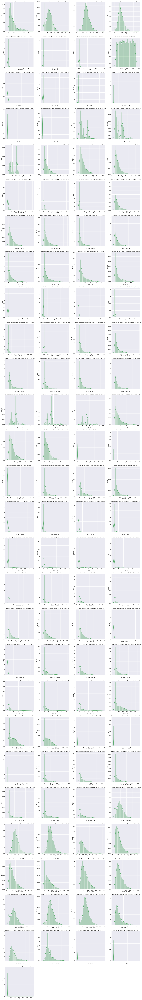

Execution End Time :  2024-09-10 22:46:45.213246
Execution time: 32.24882936477661 seconds


In [479]:
# Start time
start_time = time.time()
print("Execution Start Time : " , datetime.now())

# Define the number of subplots (adjust according to your needs)
num_plots = len(num_cols)
# Number of columns in the subplot grid
fig_num_cols = 4  
fig_num_rows = (num_plots // fig_num_cols) + (num_plots % fig_num_cols != 0)  # Calculate number of rows needed
# Set the figure size (width, height) in inches
fig_width = fig_num_cols * 6
fig_height = fig_num_rows * 6
# Create the figure
plt.figure(figsize=(fig_width, fig_height))
# Create subplots
for ax, col in enumerate(num_cols):
    plt.subplot(fig_num_rows, fig_num_cols, ax + 1)
    # Generate a plot for the current column
    sns.distplot( churn_data[col] , color='#55A868' )
    # Set the title for the current subplot
    plt.title( f' Univariate Analysis of variable using Distplot - {col} ' )
# Adjust subplot parameters for a tight layout
plt.tight_layout()
# Display the plots
plt.show()
# End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

### Categorical Columns

In [481]:
# Start time
start_time = time.time()
print("Execution Start Time : " , datetime.now())
# Define the number of subplots (adjust according to your needs)
num_plots = len(cat_cols)
# Number of columns in the subplot grid
fig_num_cols = 4  
fig_num_rows = (num_plots // fig_num_cols) + (num_plots % fig_num_cols != 0)  # Calculate number of rows needed
# Set the figure size (width, height) in inches
fig_width = fig_num_cols * 6
fig_height = fig_num_rows * 6
# Create the figure
plt.figure(figsize=(fig_width, fig_height))
# Loop through each column to create a subplot
for ax , col in enumerate(cat_cols):
    # Create a subplot for each column
    plt.subplot(fig_num_rows, fig_num_cols, ax+ 1)
    # Order the data
    sort_order=sorted(churn_data[col].unique())
    # Generate a  plot for the current column
    sns.countplot( data=churn_data , x=col , palette='deep' ,order=sort_order)
    # Set the title for the current subplot
    plt.title( f'Univariate Analysis of Variable - {col}' )
# Adjust subplot parameters for a tight layout
plt.tight_layout()
# Display the plots
plt.show()
# End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-10 22:47:53.949658


<Figure size 2400x0 with 0 Axes>

Execution End Time :  2024-09-10 22:47:53.952658
Execution time: 0.0029997825622558594 seconds


### Bivariate Analysis

Execution Start Time :  2024-09-10 22:47:57.700534


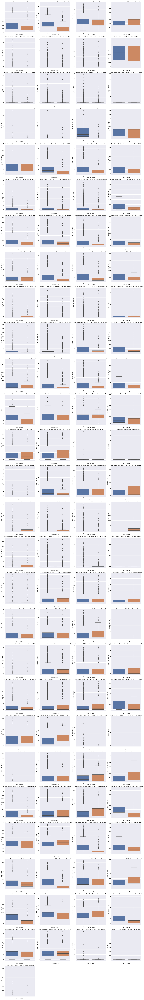

Execution End Time :  2024-09-10 22:48:12.606382
Execution time: 14.905848503112793 seconds


In [482]:
# Numerical Vs Categorical
# Start time
start_time = time.time()
print("Execution Start Time : " , datetime.now())
# Define the number of subplots (adjust according to your needs)
num_plots = len(num_cols)
# Number of columns in the subplot grid
fig_num_cols = 4  
fig_num_rows = (num_plots // fig_num_cols) + (num_plots % fig_num_cols != 0)  # Calculate number of rows needed
# Set the figure size (width, height) in inches
fig_width = fig_num_cols * 6
fig_height = fig_num_rows * 6
# Create the figure
plt.figure(figsize=(fig_width, fig_height))
# Loop through each column to create a subplot
for ax, col in enumerate(num_cols):
    # Create a subplot for each column
    plt.subplot(fig_num_rows, fig_num_cols, ax+ 1)
    sns.boxplot(x=churn_data[target_col], y=churn_data[col], palette='deep')
    plt.title(f' Bivariate Analysis of Variable - {col} Vs. {target_col} ')
# Adjust layout
plt.tight_layout()
# Display the plots
plt.show()
# End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

In [483]:
# Categorical Vs Categorical
# Start time
start_time = time.time()
print("Execution Start Time : " , datetime.now())
# Define the number of subplots (adjust according to your needs)
num_plots = len(cat_cols)
# Number of columns in the subplot grid
fig_num_cols = 4  
fig_num_rows = (num_plots // fig_num_cols) + (num_plots % fig_num_cols != 0)  # Calculate number of rows needed
# Set the figure size (width, height) in inches
fig_width = fig_num_cols * 6
fig_height = fig_num_rows * 6
# Create the figure
plt.figure(figsize=(fig_width, fig_height))
# Create subplots
for ax, col in enumerate(cat_cols):
    # Create a subplot for each column
    plt.subplot(fig_num_rows, fig_num_cols, ax+ 1)
    sort_order = sorted(churn_data[col].unique())
    sns.countplot(data=churn_data, x=col, hue=target_col, palette='deep', order=sort_order)
    plt.title(f' Bivariate Analysis of Variable - {col} Vs. {target_col} ')
# Adjust layout
plt.tight_layout()
# Display the plots
plt.show()
# End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-10 22:48:12.610902


<Figure size 2400x0 with 0 Axes>

Execution End Time :  2024-09-10 22:48:12.610902
Execution time: 0.0 seconds


### Multivariate Analysis

Execution Start Time :  2024-09-10 22:48:15.747892


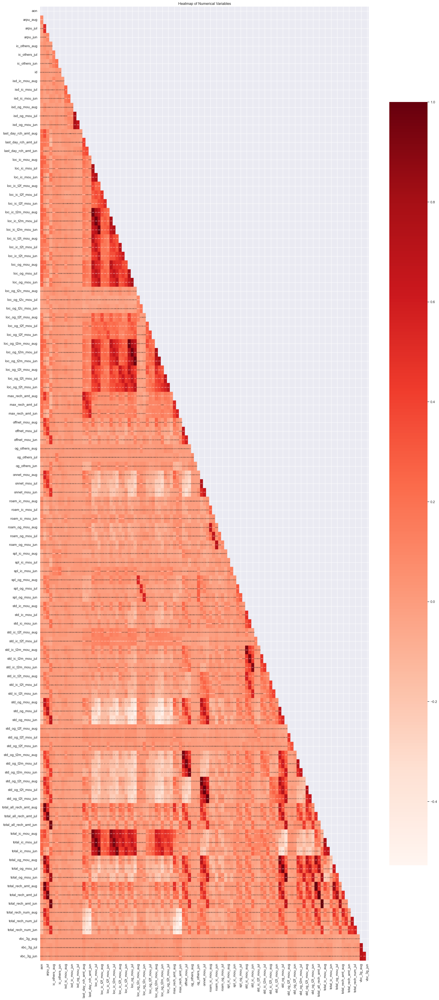

Execution End Time :  2024-09-10 22:48:22.318415
Execution time: 6.570523500442505 seconds


In [484]:
#Heatmap of Specific Numerical Variables
# Start time
start_time = time.time()
print("Execution Start Time : " , datetime.now())
# Define the number of subplots (adjust according to your needs)
num_plots = len(num_cols)
# Number of columns in the subplot grid
fig_num_cols = 4  
fig_num_rows = (num_plots // fig_num_cols) + (num_plots % fig_num_cols != 0)  # Calculate number of rows needed
# Set the figure size (width, height) in inches
fig_width = fig_num_cols * 6
fig_height = fig_num_rows * 2
# Create the figure
plt.figure(figsize=(fig_width, fig_height))
mask = np.triu(churn_data[num_cols].corr())
sns.heatmap(churn_data[num_cols].corr(),mask=mask,annot=True,cmap="Reds",annot_kws={"size": 4},cbar_kws={'shrink': 0.8})
plt.title('Heatmap of Numerical Variables')
# Display the plots
plt.show()
# End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

### Analyze August Data Usage and Recharge Amounts with Various Hue Indicators"

Execution Start Time :  2024-09-10 17:25:56.694447


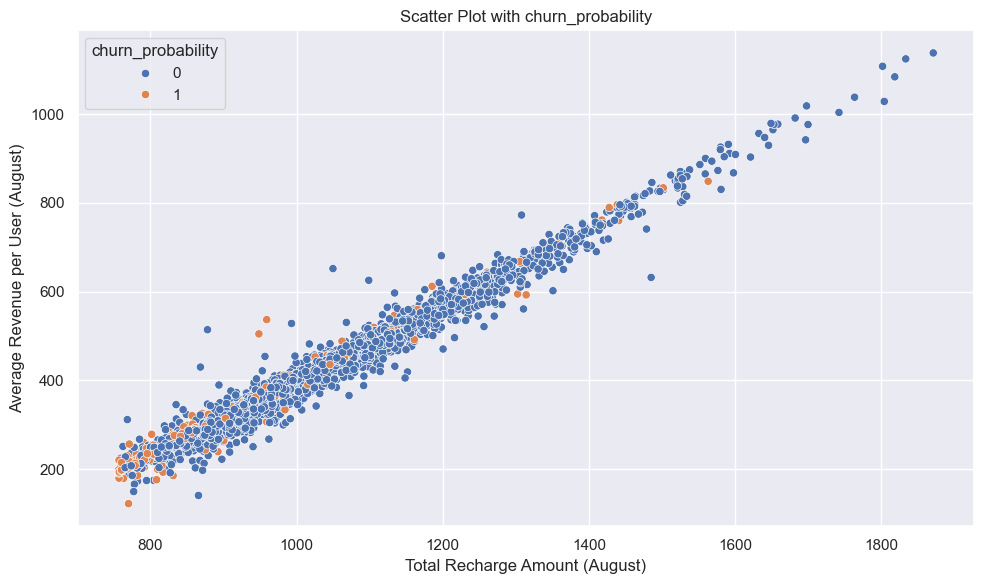

Execution End Time :  2024-09-10 17:25:57.066835
Execution time: 0.3723883628845215 seconds


In [90]:
# Start time
start_time = time.time()
print("Execution Start Time : " , datetime.now())

# Define columns for the X and Y axes
cols_x_aug = 'mean_all_total_rech_amt_months'  # Total recharge amount in months
cols_y_aug = 'mean_arpu_months'    # Average revenue per user in months

# Define the columns to be used as hue (color) in the scatter plots
cols_hue_aug = ['churn_probability']

# Create individual scatter plots for each hue column
for hue_col in cols_hue_aug:
    plt.figure(figsize=(10, 6))  # Set figure size to be manageable
    
    # Create a scatter plot with the specified X and Y columns and hue
    sns.scatterplot(data=churn_data, x=cols_x_aug, y=cols_y_aug, hue=hue_col, 
                    palette='deep')
    
    # Set the title for the scatter plot
    plt.title(f'Scatter Plot with {hue_col}')
    
    # Set the labels for the X and Y axes
    plt.xlabel('Total Recharge Amount (August)')
    plt.ylabel('Average Revenue per User (August)')
    
    # Adjust the layout to prevent overlapping elements
    plt.tight_layout()
    
    # Display the plot
    plt.show()

# End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

### Observations from the Bivariate Analysis :
    
    - Call Usage: Most users show low call usage, with some heavy users as outliers.
    - Churn Probability: Higher usage generally correlates with a higher likelihood of churn.
    - Outliers: Numerous outliers suggest a few users have extreme usage patterns.
    - Monthly Comparison: Median usage is consistent across months, but individual behaviors vary.
    - Roaming Usage: High variance in roaming usage, with heavy roamers showing more churn risk.
    - Data Usage (2G/3G): Higher data consumption is linked to a greater chance of churn.
    - Service Type Influence: Frequent STD and ISD callers tend to have a higher churn probability.
    - Facebook and similar social networking sites user : Most users are not Facebook users across all three months, with a consistent trend of slightly higher churn among non-users.
    - Monthly 2G Usage: Across June, July, and August, the majority of users have minimal 2G usage, with a higher churn rate observed among users with increased 2G usage.
    - Monthly 3G Usage: Consistently low 3G usage across all three months, with higher 3G usage correlating with a higher churn probability.
    - Night Pack Users: Most users do not use night packs in any of these months, with a small segment of night pack users showing a higher churn rate.
    
### Observations from the Multivariate Analysis:
    - High correlation among ARPU variables in June, July, and August.
    - Strong positive correlations among total_rech_amt variables for all months.
    - Moderate correlation between outgoing and incoming minutes of usage.
    - Weak correlation between total recharge numbers and ARPU.
    - Stable user behavior across different months.
    - Potential redundancy in variables due to high correlations.
    - Consistent trends in total minutes of usage (total_mou) across months.
    - Recharge and usage patterns are closely linked.
    - Low negative correlation between some recharge and usage metrics.
    - Higher correlations in same-category features like total_arpu and total_mou
    - Churn Probability vs. Total Spent: Most churn cases occur with lower spending in August.
    - Facebook Usage vs. Total Spent: Users are split into two groups with no clear spending pattern.
    - 2G Usage vs. Total Spent: 2G usage varies widely across different spending levels.
    - 3G Usage vs. Total Spent: 3G usage also shows diverse patterns with spending in August.

## Interfences :
    - Age on Network (aon): AON seems to be a strong indicator of churn, with most users churning around 850 days.
    - Total Recharge Amount (total_rech_amt): The recharge amount was significantly higher for churned customers in June and July but dropped sharply in August.
    - Data Recharge Amount (total_rech_data_amt): Data recharge amounts also decreased each month for churned customers.
    - Average Revenue Per User (total_arpu_2g_3g): There was a significant drop in ARPU for churned customers between the "good" and "action" phases.
    - Maximum Recharge Amount (max_rech_amt): Churned customers saw a notable drop in their maximum recharge amounts between the "good" and "action" phases.
    - Total Recharge Values (total_rech_amt): The biggest drop in total recharge values occurred among churned customers compared to non-churned customers between the "good" and "action" phases.
    - Maximum Data Recharge Values (max_rech_data): Churned customers also experienced the largest decline in maximum data recharges compared to non-churned customers during this period.
    - Data Pack Usage (night_pck_user, monthly_2g_, monthly_3g_): For night, 2G, and 3G data packs, the churn rate was significant in the "action" phase.
    - On-net and Off-net Usage (onnet_mou, offnet_mou): Churned customers had the highest drop in on-net and off-net values compared to non-churned customers between the "good" and "action" phases.
    - Revenue Per User (total_arpu_2g_3g): Both 2G and 3G usage showed similar trends in revenue per user across the months.
    Roaming Usage (total_roam_mou_aug, total_roam_mou_jul, total_roam_mou_jun): High roaming charges are associated with increased churn, indicating that users with significant roaming activity are more likely to switch providers.
    - Call Usage Patterns (mean_total_std_mou, mean_total_ic_mou): Users with high call usage, especially those who frequently make STD and ISD calls, exhibit a higher churn probability, suggesting dissatisfaction with current pricing or service plans.
    - 2G and 3G Data Usage (total_vol_2g_3g_mb_aug, total_vol_2g_3g_mb_jul, total_vol_2g_3g_mb_jun): Higher data usage, both in 2G and 3G categories, correlates with increased churn, highlighting a potential need for better data package options or enhanced service quality for high-data users.
    - Night Pack Usage (night_pck_user_aug, night_pck_user_jul, night_pck_user_jun): Despite a small segment of night pack users, this group shows a higher churn rate, indicating that night pack offerings may not be meeting user expectations or needs effectively.
    - Facebook Usage Correlation (fb_user_aug, fb_user_jul, fb_user_jun): Users who are not on Facebook tend to have a slightly higher churn rate, suggesting that engagement with social networks could be linked to greater service satisfaction or loyalty.
    - Monthly Usage Consistency (total_mou_aug, total_mou_jul, total_mou_jun): Consistent monthly median usage, despite individual variations, suggests that overall user behavior remains stable, but outliers with extreme usage patterns could be driving churn.
    - Recharge Frequency (total_rech_num_aug, total_rech_num_jul, total_rech_num_jun): Users with a high frequency of recharges but lower total recharge amounts show an increased likelihood of churn, indicating potential dissatisfaction or financial constraints affecting their spending patterns.

# Model Building

### Let's drop date columns first

In [338]:
### churn_data=churn_data_copy5.copy()
### churn_data_unseen=churn_data_unseen_copy5.copy()

In [339]:
churn_data_copy5=churn_data.copy()
churn_data_unseen_copy5=churn_data_unseen.copy()

In [340]:
### drop date columns
churn_data.drop(churn_data_columns["datetime_columns"], axis=1,inplace=True)
churn_data_unseen.drop(churn_data_unseen_columns["datetime_columns"], axis=1,inplace=True)
# drop id
churn_data.drop("id", axis=1,inplace=True)

In [341]:
# update column_dict
churn_data_columns=findCustomColumnTypes(df=churn_data, search_type='all_search', target_column=target_col, include_all=False,  keyword=None , cut_off_val=7)
churn_data_unseen_columns=findCustomColumnTypes(df=churn_data_unseen, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)
# Print Date columns
print ("Check datetime variables - in Seen and Unseen sets" , churn_data_columns["datetime_columns"] ,churn_data_unseen_columns["datetime_columns"] )
# Print the shape of the DataFrame after imputation for the training set
print("Seen Set Shape :- ", churn_data.shape)
# Separator line for clarity
print("=" * 120)
# Print the shape of the DataFrame after imputation for the test set
print("Unseen Set Shape :- ", churn_data_unseen.shape)

Check datetime variables - in Seen and Unseen sets [] []
Seen Set Shape :-  (3628, 200)
Unseen Set Shape :-  (30000, 200)


In [342]:
## Lets check the columns with missing values 
cut_off=0
missing_values_cols_seen=getMissingValues(churn_data[churn_data_columns["numerical_columns"]],cut_off,"Seen","Numerical")
# Separator line
print("="*120) 
missing_values_cols_unseen=getMissingValues(churn_data_unseen[churn_data_columns["numerical_columns"]],cut_off,"Unseen","Numerical")

----- Numerical variables of Seen dataset having missing values above cutoff value (0%) : -----
Series([], dtype: float64)
Total number of Numerical variables of Seen dataset having missing values above cutoff value (0%) : 0
----- Numerical variables of Unseen dataset having missing values above cutoff value (0%) : -----
Series([], dtype: float64)
Total number of Numerical variables of Unseen dataset having missing values above cutoff value (0%) : 0


In [343]:
# update column_dict
churn_data_columns=findCustomColumnTypes(df=churn_data, search_type='all_search', target_column=target_col, include_all=False,  keyword=None , cut_off_val=7)
churn_data_unseen_columns=findCustomColumnTypes(df=churn_data_unseen, search_type='all_search', target_column=target_col, include_all=False,  keyword=None)

# Print the shape of the DataFrame after imputation for the training set
print("Seen Set Shape :- ", churn_data.shape)
# Separator line for clarity
print("=" * 120)
# Print the shape of the DataFrame after imputation for the test set
print("Unseen Set Shape :- ", churn_data_unseen.shape)

Seen Set Shape :-  (3628, 200)
Unseen Set Shape :-  (30000, 200)


### Train - Test Split

In [344]:
# Putting target variable to y
y = churn_data[target_col]

# Remove target variable from all features and assign X
X = churn_data.drop(target_col, axis=1)

print( X.shape , y.shape)

(3628, 199) (3628,)


In [345]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=42)
print( X_train.shape , X_test.shape , y_train.shape , y_test.shape )

(2539, 199) (1089, 199) (2539,) (1089,)


### Balancing the Dataset using SMOTE

In [346]:
# Instantiate SMOTE
smote = SMOTE( random_state=42 )
# Fittign SMOTE to the train set
X_train, y_train = smote.fit_resample(X_train, y_train)
# Check data imbalance in the target column i.e., 'churn_probability' for train set
round ( 100 * y_train.value_counts(normalize=True) , 2)

churn_probability
0    50.0
1    50.0
Name: proportion, dtype: float64

### Feature Scaling

In [347]:
# Instantiate the Scaler
scaler = StandardScaler()
column_to_scale=churn_data_columns["numerical_columns"]+churn_data_columns["categorical_columns"]
# Fit the data into scaler and transform
#X_train_scaled=X_train.copy()
X_train[column_to_scale] = scaler.fit_transform(X_train[column_to_scale])
# Transform the test set
#X_test_scaled=X_test.copy()
X_test[column_to_scale] = scaler.transform(X_test[column_to_scale])
# Print the shape of the transformed training and testing datasets
# X_train and X_test are now scaled; their shapes remain unchanged
print(f"Shape of X_train: {X_train.shape}, X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}, y_test: {y_test.shape}")

Shape of X_train: (4402, 199), X_test: (1089, 199)
Shape of y_train: (4402,), y_test: (1089,)


In [348]:
X_train.describe()

,arpu_jun,arpu_jul,arpu_aug,onnet_mou_jun,onnet_mou_jul,onnet_mou_aug,offnet_mou_jun,offnet_mou_jul,offnet_mou_aug,roam_ic_mou_jun,...,mean_total_rech_amt_months,mean_all_total_rech_amt_months,mean_total_rech_data_months,mean_av_rech_amt_data_months,mean_night_pck_user_months,mean_fb_user_months,mean_sachet_3g_months,mean_sachet_2g_months,mean_monthly_3g_months,mean_monthly_2g_months
count,4.402000e+03,4.402000e+03,4.402000e+03,4.402000e+03,4.402000e+03,4402.000000,4.402000e+03,4.402000e+03,4.402000e+03,4.402000e+03,...,4.402000e+03,4.402000e+03,4402.0,4.402000e+03,4.402000e+03,4402.0,4402.0,4402.0,4402.0,4402.0
mean,-7.102199e-17,-7.102199e-17,7.747854e-17,-5.810890e-17,3.873927e-17,0.000000,-2.582618e-17,-2.582618e-17,-2.582618e-17,6.456545e-18,...,-2.324356e-16,3.615665e-16,0.0,-5.684342e-14,3.469447e-18,0.0,0.0,0.0,0.0,0.0
std,1.000114e+00,1.000114e+00,1.000114e+00,1.000114e+00,1.000114e+00,1.000114,1.000114e+00,1.000114e+00,1.000114e+00,1.000114e+00,...,1.000114e+00,1.000114e+00,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.0
min,-2.203484e+00,-2.286438e+00,-1.168450e+00,-9.011007e-01,-8.632684e-01,-0.661990,-1.033678e+00,-1.033230e+00,-8.510325e-01,-2.624580e-01,...,-1.303141e+00,-1.303122e+00,0.0,-5.684342e-14,3.469447e-18,0.0,0.0,0.0,0.0,0.0
25%,-6.834816e-01,-6.215270e-01,-9.543519e-01,-7.590095e-01,-7.279143e-01,-0.598576,-7.284291e-01,-7.393796e-01,-7.161359e-01,-2.624580e-01,...,-7.386833e-01,-7.387101e-01,0.0,-5.684342e-14,3.469447e-18,0.0,0.0,0.0,0.0,0.0
50%,-1.383355e-01,-1.101576e-01,-1.313271e-01,-4.528417e-01,-4.398674e-01,-0.413947,-3.273272e-01,-3.186328e-01,-3.766704e-01,-2.624580e-01,...,-2.461352e-01,-2.461147e-01,0.0,-5.684342e-14,3.469447e-18,0.0,0.0,0.0,0.0,0.0
75%,5.719707e-01,5.575263e-01,6.544018e-01,5.240590e-01,4.828086e-01,0.060408,3.829661e-01,4.172147e-01,3.500028e-01,-2.553079e-01,...,4.777837e-01,4.777438e-01,0.0,-5.684342e-14,3.469447e-18,0.0,0.0,0.0,0.0,0.0
max,5.024125e+00,4.504313e+00,5.673659e+00,4.402077e+00,4.998745e+00,5.530727,4.266325e+00,4.798471e+00,5.033117e+00,1.254016e+01,...,5.569585e+00,5.569616e+00,0.0,-5.684342e-14,3.469447e-18,0.0,0.0,0.0,0.0,0.0


### Model with PCA

In [349]:
# Instantiate PCA
pca = PCA(random_state=42)
# Fit train set on PCA
pca.fit(X_train)

PCA(random_state=42)

In [350]:
# Principal components
pca.components_

array([[-0.01139128,  0.0093628 ,  0.06840669, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.0615193 ,  0.18967792,  0.18811355, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.10974469, -0.04800931, -0.06176573, ..., -0.        ,
        -0.        , -0.        ],
       ...,
       [ 0.        ,  0.        ,  0.        , ...,  1.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         1.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  1.        ]])

In [351]:
# Cumuliative varinace of the PCs
variance_cumu = np.cumsum(pca.explained_variance_ratio_)
print(variance_cumu)

[0.14144892 0.25097691 0.31316936 0.36812592 0.41400305 0.45020862
 0.4829679  0.50891877 0.53438249 0.55896403 0.58071958 0.60134084
 0.62074864 0.63883394 0.65614171 0.67314783 0.68956692 0.70431226
 0.71800369 0.73127547 0.74395574 0.7560417  0.76718377 0.77716526
 0.78678916 0.79597008 0.80446722 0.81252585 0.82045744 0.82830356
 0.835778   0.84295342 0.84994458 0.85664004 0.86320851 0.86936865
 0.87529018 0.88107346 0.88673343 0.89222277 0.89766413 0.90291608
 0.90793883 0.91289859 0.91776122 0.92240808 0.9267244  0.93090771
 0.93498619 0.93883491 0.94260199 0.94616643 0.94963754 0.95290778
 0.95606982 0.95905664 0.96203222 0.96493749 0.96764788 0.97029107
 0.97267008 0.97500767 0.97727379 0.97944784 0.98153615 0.98357356
 0.98548837 0.98736389 0.9890463  0.99068286 0.99211793 0.99354162
 0.9949016  0.99593702 0.9967708  0.99749554 0.99819595 0.99881822
 0.99917404 0.99944915 0.9996463  0.99978291 0.99988407 0.99996103
 0.99997633 0.99998371 0.99999042 0.99999395 0.9999971  0.9999

### Scree Plot

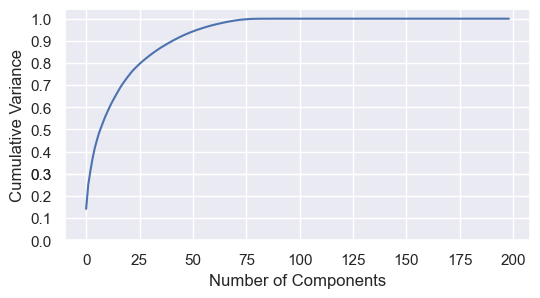

In [352]:
# Plotting scree plot
fig = plt.figure(figsize = (6,3))
plt.plot(variance_cumu)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance')
plt.yticks([0,0.1,0.2,0.3,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.show()

In [353]:
# Find the number of components where cumulative variance exceeds 95%
n_components_95 = np.argmax(variance_cumu >= 0.95) + 1

print(f"The number of components that explain at least 95% of the variance is: {n_components_95}")

The number of components that explain at least 95% of the variance is: 54


#### We can see that `70 components` explain amost more than 95% variance of the data. So, we will perform PCA with 60 components.

### So will perform PCA again with 70 components

In [354]:
# Instantiate PCA with 95% variance
pca_final = IncrementalPCA(n_components=n_components_95)
# Fit and transform the X_train
X_train_pca = pca_final.fit_transform(X_train)
# Applying transformation on the test set
X_test_pca = pca_final.transform(X_test)

# Print the shape of the transformed training and testing datasets
# X_train and X_test are now scaled; their shapes remain unchanged
print(f"Shape of X_train: {X_train_pca.shape}, X_test: {X_test_pca.shape}")
print(f"Shape of y_train: {y_train.shape}, y_test: {y_test.shape}")

Shape of X_train: (4402, 54), X_test: (1089, 54)
Shape of y_train: (4402,), y_test: (1089,)


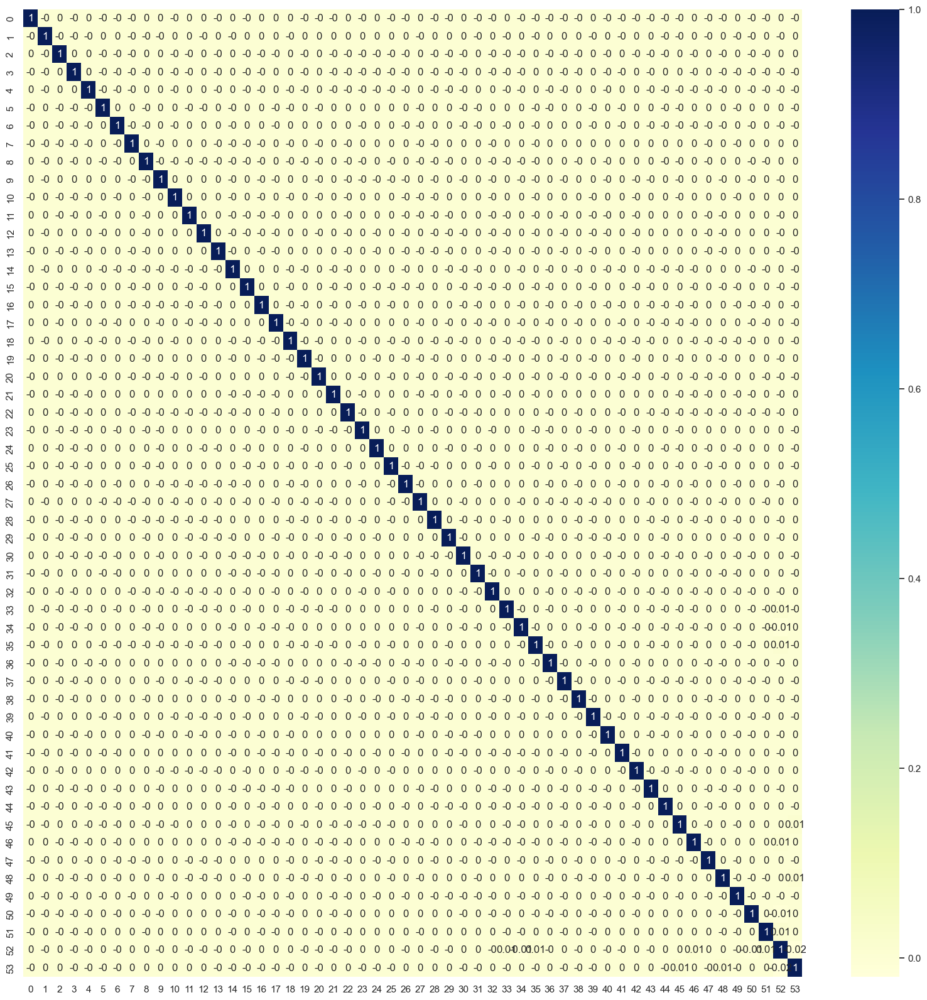

In [355]:
# Validate corr matrix
## Checking for multi-collinearity with HeatMap
corr = np.round(np.corrcoef(X_train_pca.transpose()),2)
plt.figure(figsize = (20,20))
sns.heatmap(corr, annot= True, cmap="YlGnBu")
plt.show()

### Model with TSNE

In [356]:
# Log Start Time
start_time=time.time()
print("Execution Start Time : " , datetime.now())

# Apply t-SNE to the PCA-reduced data
tsne = TSNE(n_components=2, random_state=42)
X_train_tsne = tsne.fit_transform(X_train_pca)

# Optionally, apply t-SNE on the test set (not common)
X_test_tsne = tsne.fit_transform(X_test_pca)

# Log End time
end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-10 22:01:51.442440
Execution End Time :  2024-09-10 22:02:16.687168
Execution time: 25.244728326797485 seconds


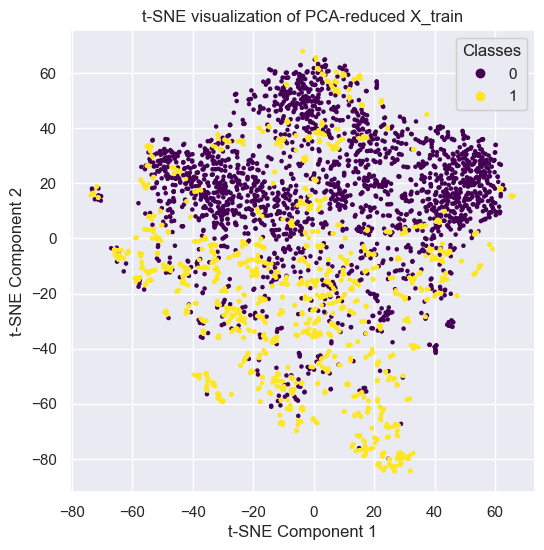

In [357]:
# Plotting the t-SNE results
fig, ax = plt.subplots(figsize=(6, 6))
scatter = ax.scatter(X_train_tsne[:, 0], X_train_tsne[:, 1], c=y_train, cmap='viridis', s=5)
legend1 = ax.legend(*scatter.legend_elements(), title="Classes")
ax.add_artist(legend1)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE visualization of PCA-reduced X_train')
plt.show()

# We will now try the below Models :-
1. <b>Logistic Regression on Train - Test Set:</b>
     - Train a Logistic Regression model on the training set.
     - Evaluate its performance on the test set using appropriate metrics such as accuracy, sensitivity, specificity, etc.
2. <b>Decision Tree Classifier on Train - Test Set:</b>
    - Train a Decision Tree Classifier on the training set.
    - Assess its performance on the test set to understand its strengths and weaknesses compared to other models.
3. <b>Random Forest Classifier on Train - Test Set:</b>
    - Train a Random Forest Classifier on the training set.
    - Evaluate its performance on the test set to see how well it generalizes.
4. <b>Random Forest Classifier on Entire Seen Set:</b>
    - Train a Random Forest Classifier on the entire seen dataset (a combination of the training and test sets, or a larger dataset that has been completely observed).
    - This will give us an understanding of how the model performs on a comprehensive dataset.
5. <b>Create Final Pipeline Model as per the Best Result:</b>
    - Based on the evaluation of the above models, select the one that provides the best results.
    - Build the final model pipeline using the chosen algorithm. This pipeline will include data preprocessing steps, model training, and potentially hyperparameter tuning.

## Some useful custom functions

In [358]:
def evaluate_model( X_true, y_true, estimator, data_name, dataset_type, cut_off=0.5 ):
    
    print(f"Evaluating {dataset_type} Set: data set name - {data_name}")
    # Prediction
    y_pred = estimator.predict(X_true)
    y_pred_prob = estimator.predict_proba(X_true)[:, 1]
    
    if cut_off!=0.5 :
        # Binarize predictions based on the cutoff
        y_pred = [1 if prob >= cut_off else 0 for prob in y_pred_prob]
    
    # Confusion matrix
    confusion = confusion_matrix(y_true, y_pred)
    print("Confusion Matrix:\n", confusion)
    
    # Classification report
    classification = classification_report(y_true, y_pred)
    print("\nClassification Report:\n", classification)
    
    # Extract TP, TN, FP, FN
    TP = confusion[1, 1]  # True Positive
    TN = confusion[0, 0]  # True Negative
    FP = confusion[0, 1]  # False Positive
    FN = confusion[1, 0]  # False Negative
    
    # Accuracy
    accuracy = accuracy_score(y_true, y_pred)
    print(f"Accuracy: {round(100 * accuracy, 2)}%")
    
    # Sensitivity (Recall for the positive class)
    sensitivity = TP / float(TP + FN) if (TP + FN) > 0 else 0
    print(f"Sensitivity: {round(100 * sensitivity, 2)}%")
    
    # Specificity (Recall for the negative class)
    specificity = TN / float(TN + FP) if (TN + FP) > 0 else 0
    print(f"Specificity: {round(100 * specificity, 2)}%")
    
    # Precision
    precision = precision_score(y_true, y_pred)
    print(f"Precision: {round(100 * precision, 2)}%")
    
    # Recall
    recall = recall_score(y_true, y_pred)
    print(f"Recall: {round(100 * recall, 2)}%")
    
    # ROC AUC score
    roc_auc = roc_auc_score(y_true, y_pred_prob)
    print(f"ROC AUC Score: {round(100 * roc_auc, 2)}%")
    
    return accuracy,sensitivity,specificity,precision,recall,roc_auc

In [359]:
def plot_roc_curve( X_true, y_true, estimator, data_name, dataset_type ):
    print(f"Evaluating {dataset_type} Set: data set name - {data_name}")
    # Prediction
    y_pred = estimator.predict(X_true)
    y_pred_prob = estimator.predict_proba(X_true)[:, 1]
    # Compute False Positive Rate (FPR) and True Positive Rate (TPR)
    fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)
    auc_score = roc_auc_score(y_true, y_pred_prob)
    plt.figure(figsize=(6, 3))
    # Plot the ROC curve
    plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc_score:.2f})')
    # Diagonal line for random guessing
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

In [360]:
def find_optimal_cutoff2(X_true, y_true, estimator, data_name, dataset_type, start=0.0, end=1.1, step=0.1):
    """
    Function to find the optimal probability cutoff for classifying binary outcomes (e.g., churn vs. non-churn) 
    using a given estimator (e.g., logistic regression).
    
    Parameters:
    - X_true: Feature matrix for the dataset to be evaluated.
    - y_true: Actual binary labels (0 or 1) for the target variable.
    - estimator: Trained model used to predict probabilities for the positive class.
    - data_name: Name of the dataset being evaluated (used for print statements).
    - dataset_type: Type of the dataset (e.g., 'Train' or 'Test') being evaluated (used for print statements).
    - start: Starting value for the range of probability cutoffs (default is 0.0).
    - end: Ending value for the range of probability cutoffs (default is 1.1 to include 1.0).
    - step: Step size for iterating through probability cutoffs (default is 0.1).
    
    Returns:
    - cutoff: DataFrame containing the cutoff values and their corresponding metrics (accuracy, sensitivity, specificity).
    - optimal_cutoff: The cutoff value that optimizes the chosen metric (in this case, accuracy).
    """
    print(f"Evaluating {dataset_type} Set: data set name - {data_name}")
    
    # Prediction probabilities for the positive class
    y_pred_prob = estimator.predict_proba(X_true)[:, 1]
    
    # Define cutoff values
    numbers = np.arange(start, end, step)
    
    # List to store results
    results = []

    for i in numbers:
        # Binarize predictions based on cutoff
        y_pred = [1 if prob >= i else 0 for prob in y_pred_prob]

        # Compute confusion matrix
        cm = confusion_matrix(y_true, y_pred)

        # Calculate metrics
        accuracy = (cm[0, 0] + cm[1, 1]) / cm.sum()
        specificity = cm[0, 0] / (cm[0, 0] + cm[0, 1]) if (cm[0, 0] + cm[0, 1]) > 0 else 0
        sensitivity = cm[1, 1] / (cm[1, 0] + cm[1, 1]) if (cm[1, 0] + cm[1, 1]) > 0 else 0

        # Store the results in a dictionary
        results.append({
            'probability': i, 
            'accuracy': accuracy, 
            'sensitivity': sensitivity, 
            'specificity': specificity
        })

    # Convert results list to DataFrame
    cutoff = pd.DataFrame(results)

    print(cutoff)

    # Plot the results
    plt.figure(figsize=(8, 6))
    cutoff.plot.line(x='probability', y=['accuracy', 'sensitivity', 'specificity'], marker='o')
    plt.title('Cutoff vs Accuracy, Sensitivity, Specificity')
    plt.xlabel('Probability Cutoff')
    plt.ylabel('Metric Value')
    plt.grid(True)
    plt.show()

    # Find the optimal cutoff based on accuracy
    optimal_cutoff = cutoff.loc[cutoff['accuracy'].idxmax()]

    print(f"Optimal Cutoff: {optimal_cutoff['probability']:.2f}")
    print(f"Accuracy: {optimal_cutoff['accuracy']:.2f}")
    print(f"Sensitivity: {optimal_cutoff['sensitivity']:.2f}")
    print(f"Specificity: {optimal_cutoff['specificity']:.2f}")

    return cutoff, optimal_cutoff['probability']

In [361]:
def find_optimal_cutoff(X_true, y_true, estimator, data_name, dataset_type , start=0.0 , end=1.1 , step=0.1):
    """
    Function to find the optimal probability cutoff for classifying binary outcomes (e.g., churn vs. non-churn) 
    using a given estimator (e.g., logistic regression).
    
    Parameters:
    - X_true: Feature matrix for the dataset to be evaluated.
    - y_true: Actual binary labels (0 or 1) for the target variable.
    - estimator: Trained model used to predict probabilities for the positive class.
    - data_name: Name of the dataset being evaluated (used for print statements).
    - dataset_type: Type of the dataset (e.g., 'Train' or 'Test') being evaluated (used for print statements).
    - start: Starting value for the range of probability cutoffs (default is 0.0).
    - end: Ending value for the range of probability cutoffs (default is 1.1 to include 1.0).
    - step: Step size for iterating through probability cutoffs (default is 0.1).
    
    Returns:
    - cutoff: DataFrame containing the cutoff values and their corresponding metrics (accuracy, sensitivity, specificity).
    - optimal_cutoff: The cutoff value that optimizes the chosen metric (in this case, accuracy).
    """
    print(f"Evaluating {dataset_type} Set: data set name - {data_name}")
    # Prediction
    y_pred = estimator.predict(X_true)
    y_pred_prob = estimator.predict_proba(X_true)[:, 1]
    
    # Let's create columns with different probability cutoffs
    numbers = np.arange(start, end , step)
    
    cutoff = pd.DataFrame(columns=['probability', 'accuracy', 'sensitivity', 'specificity'])

    for i in numbers:
        # Binarize predictions based on cutoff
        y_pred = [1 if prob > i else 0 for prob in y_pred_prob]

        # Compute confusion matrix
        cm = confusion_matrix(y_true, y_pred)

        # Calculate metrics
        accuracy = (cm[0, 0] + cm[1, 1]) / cm.sum()
        specificity = cm[0, 0] / (cm[0, 0] + cm[0, 1]) if (cm[0, 0] + cm[0, 1]) > 0 else 0
        sensitivity = cm[1, 1] / (cm[1, 0] + cm[1, 1]) if (cm[1, 0] + cm[1, 1]) > 0 else 0

        # Store the results
        cutoff.loc[i] = [i, accuracy, sensitivity, specificity]

    print(cutoff)

    # Plot the results
    plt.figure(figsize=(3, 3))
    cutoff.plot.line(x='probability', y=['accuracy', 'sensitivity', 'specificity'])
    plt.title('Cutoff vs Accuracy, Sensitivity, Specificity')
    plt.xlabel('Probability Cutoff')
    plt.ylabel('Metric Value')
    plt.grid(True)
    plt.show()

    # Find the optimal cutoff based on accuracy
    optimal_cutoff = cutoff.loc[cutoff['accuracy'].idxmax()]

    print(f"Optimal Cutoff: {optimal_cutoff['probability']:.2f}")
    print(f"Accuracy: {optimal_cutoff['accuracy']:.2f}")
    print(f"Sensitivity: {optimal_cutoff['sensitivity']:.2f}")
    print(f"Specificity: {optimal_cutoff['specificity']:.2f}")

    return cutoff, optimal_cutoff['probability']

In [362]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    #feature_names=X_train_pca.columns, 
                    class_names=["Not Churn", "Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

## Logistic Regression

In [363]:
# Creating KFold object with 5 splits
folds = KFold(n_splits=5, shuffle=True, random_state=42)

# Specify parameter grid
params = {"C": [0.01, 0.1, 1, 10, 100, 1000]}

# Specify multiple scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'recall': 'recall',
    'precision': 'precision',
    'f1': 'f1'
}

# Instantiate Logistic Regression
lr=LogisticRegression(random_state=42)

# Create GridSearchCV object with multiple scoring metrics
lr_model_cv = GridSearchCV(estimator=lr,
                        param_grid=params, 
                        scoring=scoring,  # Multiple scores
                        refit='accuracy', # Choose the main score for refitting
                        cv=folds,
                        n_jobs = -1,
                        verbose=3,
                        return_train_score=True)

In [364]:
# Log Start Time
start_time=time.time()
print("Execution Start Time : " , datetime.now())

# Fit the model
lr_model_cv.fit(X_train_pca, y_train)

# Log End time
end_time = time.time()
print("Execution End Time : " , datetime.now())

# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-10 22:02:17.570405
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Execution End Time :  2024-09-10 22:02:21.043218
Execution time: 3.4728126525878906 seconds


In [365]:
# results of grid search CV
cv_results = pd.DataFrame(lr_model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_accuracy,split1_test_accuracy,split2_test_accuracy,split3_test_accuracy,...,mean_test_f1,std_test_f1,rank_test_f1,split0_train_f1,split1_train_f1,split2_train_f1,split3_train_f1,split4_train_f1,mean_train_f1,std_train_f1
0,0.034211,0.005502,0.022432,0.002880,0.01,{'C': 0.01},0.860386,0.850170,0.867045,0.847727,...,0.856440,0.008281,6,0.862668,0.866797,0.856333,0.862901,0.863844,0.862509,0.003420
1,0.045880,0.010630,0.016353,0.000454,0.1,{'C': 0.1},0.867196,0.855846,0.873864,0.853409,...,0.862184,0.008678,5,0.866071,0.870417,0.863444,0.870867,0.865357,0.867231,0.002918
2,0.056069,0.006316,0.013158,0.002534,1,{'C': 1},0.868331,0.860386,0.873864,0.855682,...,0.863639,0.007506,1,0.866537,0.870220,0.863521,0.871259,0.866249,0.867557,0.002823
3,0.057329,0.008906,0.015631,0.000013,10,{'C': 10},0.869467,0.859251,0.868182,0.855682,...,0.862959,0.005398,4,0.865031,0.868135,0.863188,0.869958,0.867216,0.866705,0.002369
4,0.060473,0.007131,0.015623,0.000001,100,{'C': 100},0.870602,0.858116,0.869318,0.854545,...,0.862967,0.006181,3,0.865272,0.868304,0.862623,0.869148,0.867216,0.866513,0.002337
5,0.053157,0.007639,0.015663,0.000028,1000,{'C': 1000},0.870602,0.859251,0.869318,0.854545,...,0.863166,0.005914,2,0.865272,0.868061,0.862944,0.868903,0.867785,0.866593,0.002190


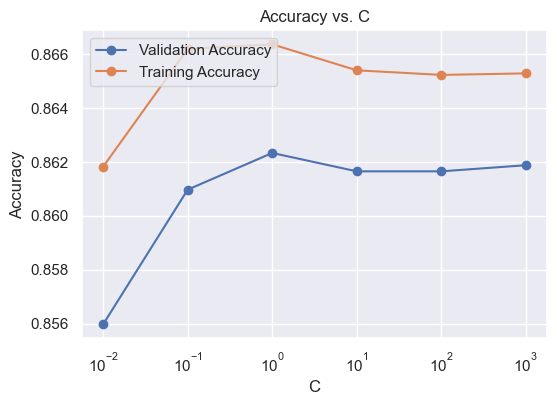

In [366]:
# plot of C versus train and validation scores

plt.figure(figsize=(6, 4))
plt.plot(cv_results['param_C'], cv_results['mean_test_accuracy'], marker='o', label='Validation Accuracy')
plt.plot(cv_results['param_C'], cv_results['mean_train_accuracy'], marker='o', label='Training Accuracy')
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.xscale('log')
plt.title('Accuracy vs. C')
plt.show()

In [367]:
# Best score with best C
best_score = round( lr_model_cv.best_score_ , 2)
best_C = lr_model_cv.best_params_['C']

print(" The highest accuracy is {0} at C = {1}".format(best_score, best_C))

# Get the best model
best_model = lr_model_cv.best_estimator_

 The highest accuracy is 0.86 at C = 1


#### Logistic regression with optimal C

In [368]:
# Instantiate the model with best C
# Get the best model
lr_best=lr_model_cv.best_estimator_
# Fit the model on the train set
lr_best_fit = lr_best.fit(X_train_pca, y_train)

### Find a cut off for optimal result

Evaluating Train Set: data set name - X_train_pca
    probability  accuracy  sensitivity  specificity
0           0.0  0.500000     1.000000     0.000000
1           0.1  0.731259     0.980463     0.482054
2           0.2  0.802817     0.951386     0.654248
3           0.3  0.836211     0.930486     0.741935
4           0.4  0.860064     0.905043     0.815084
5           0.5  0.866879     0.876420     0.857338
6           0.6  0.861199     0.837347     0.885052
7           0.7  0.845752     0.776465     0.915039
8           0.8  0.803044     0.665152     0.940936
9           0.9  0.694230     0.415720     0.972740
10          1.0  0.500000     0.000000     1.000000


<Figure size 800x600 with 0 Axes>

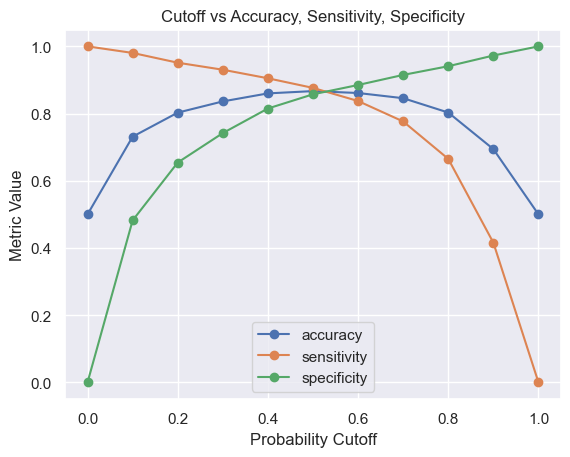

Optimal Cutoff: 0.50
Accuracy: 0.87
Sensitivity: 0.88
Specificity: 0.86


In [369]:
cutoff_df, optimal_cutoff = find_optimal_cutoff2(X_true=X_train_pca , y_true=y_train , estimator=lr_best_fit , data_name="X_train_pca", dataset_type="Train", start=0.0 , end=1.1 , step=0.1)

### Evaluate Model

In [370]:
# Evaluate Model on Train Set
train_accuracy, train_sensitivity, train_specificity, train_precision, train_recall, train_roc_auc=evaluate_model( X_true=X_train_pca , y_true=y_train , estimator=lr_best_fit , data_name="X_train_pca", dataset_type="Train" , cut_off=optimal_cutoff)

Evaluating Train Set: data set name - X_train_pca
Confusion Matrix:
 [[1887  314]
 [ 272 1929]]

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.86      0.87      2201
           1       0.86      0.88      0.87      2201

    accuracy                           0.87      4402
   macro avg       0.87      0.87      0.87      4402
weighted avg       0.87      0.87      0.87      4402

Accuracy: 86.69%
Sensitivity: 87.64%
Specificity: 85.73%
Precision: 86.0%
Recall: 87.64%
ROC AUC Score: 92.43%


### ROC Curve

Evaluating Train Set: data set name - X_train_pca


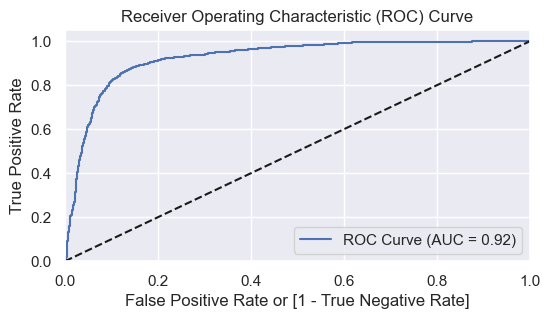

In [371]:
# Calling the function
plot_roc_curve(X_true=X_train_pca , y_true=y_train , estimator=lr_best_fit , data_name="X_train_pca", dataset_type="Train")

### Evaluate Model

In [372]:
# Evaluate Model on Test Set
test_accuracy, test_sensitivity, test_specificity, test_precision, test_recall, test_roc_auc =evaluate_model(X_true=X_test_pca , y_true=y_test , estimator=lr_best_fit , data_name="X_test_pca", dataset_type="Test" ,  cut_off=optimal_cutoff)

Evaluating Test Set: data set name - X_test_pca
Confusion Matrix:
 [[808 147]
 [ 27 107]]

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.85      0.90       955
           1       0.42      0.80      0.55       134

    accuracy                           0.84      1089
   macro avg       0.69      0.82      0.73      1089
weighted avg       0.90      0.84      0.86      1089

Accuracy: 84.02%
Sensitivity: 79.85%
Specificity: 84.61%
Precision: 42.13%
Recall: 79.85%
ROC AUC Score: 88.24%


### Update Evaluation Metrics

In [373]:
# Initialize an empty DataFrame for model_summary
model_summary = pd.DataFrame(columns=["model_name","train_accuracy","train_sensitivity","train_specificity","train_precision","train_recall","train_roc_auc","test_accuracy","test_sensitivity","test_specificity","test_precision","test_recall","test_roc_auc"])
model_summary

,model_name,train_accuracy,train_sensitivity,train_specificity,train_precision,train_recall,train_roc_auc,test_accuracy,test_sensitivity,test_specificity,test_precision,test_recall,test_roc_auc


In [374]:
# Define the model name and the estimator
model_name = "Logistic Regression"
estimator = lr_best_fit 

# Create a single dictionary to store all metrics
evaluation_metrics = {
    "model_name": model_name,
    "estimator":estimator,
    "train_accuracy": train_accuracy,
    "train_sensitivity": train_sensitivity,
    "train_specificity": train_specificity,
    "train_precision": train_precision,
    "train_recall": train_recall,
    "train_roc_auc": train_roc_auc,
    "test_accuracy": test_accuracy,
    "test_sensitivity": test_sensitivity,
    "test_specificity": test_specificity,
    "test_precision": test_precision,
    "test_recall": test_recall,
    "test_roc_auc": test_roc_auc
}


# Convert the dictionary to a DataFrame
metrics_df = pd.DataFrame([evaluation_metrics])

# Concatenate the new DataFrame with the empty model_summary DataFrame
if model_name not in list(model_summary["model_name"]) :
    model_summary = pd.concat([model_summary, metrics_df], axis=0)

# Reset Index
model_summary.reset_index(inplace=True,drop=True)
# Print out the model_summary for verification
model_summary

,model_name,train_accuracy,train_sensitivity,train_specificity,train_precision,train_recall,train_roc_auc,test_accuracy,test_sensitivity,test_specificity,test_precision,test_recall,test_roc_auc,estimator
0,Logistic Regression,0.866879,0.87642,0.857338,0.860009,0.87642,0.924317,0.84022,0.798507,0.846073,0.42126,0.798507,0.882441,"LogisticRegression(C=1, random_state=42)"


***Model summary***
- Train set
    - Accuracy: 86.19%
    - Sensitivity: 87.8%
    - Specificity: 84.58%
    - Precision: 85.06%
    - Recall: 87.8%
    - ROC AUC Score: 93.53%

- Test set
    - Accuracy: 83.4%
    - Sensitivity: 79.61%
    - Specificity: 83.72%
    - Precision: 29.32%
    - Recall: 79.61%
    - ROC AUC Score: 88.87%

Overall, the model performs well on the training and test set with high accuracy, sensitivity, specificity , and RUC_AUC score

## Decision  Tree Classifier

In [375]:
# Creating KFold object with 5 splits
folds = KFold(n_splits=5, shuffle=True, random_state=42)
# Create the parameter grid 
param_grid = {
    'max_depth': range(5, 15, 5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
}
# Specify multiple scoring metrics
scoring = {
    'accuracy': 'accuracy',
    'recall': 'recall',
    'precision': 'precision',
    'f1': 'f1'
}
# Instantiate the grid search model
dtree = DecisionTreeClassifier(random_state=42)

dtree_model_cv = GridSearchCV(estimator = dtree, 
                           param_grid = param_grid, 
                           scoring=scoring,  # Multiple scores
                           refit='accuracy', # Choose the main score for refitting
                           cv = folds,
                           n_jobs = -1,
                           verbose = 2)

In [376]:
# Log Start Time
start_time=time.time()
print("Execution Start Time : " , datetime.now())

# Fit the model
dtree_model_cv.fit(X_train_pca, y_train)

# Log End time
end_time = time.time()
print("Execution End Time : " , datetime.now())

# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-10 22:02:22.536849
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Execution End Time :  2024-09-10 22:02:24.246756
Execution time: 1.7099075317382812 seconds


In [377]:
# results of grid search CV
cv_results = pd.DataFrame(dtree_model_cv.cv_results_)

In [378]:
# Best score with best C
best_score = round( dtree_model_cv.best_score_ , 2)
print("Best accuracy:-", dtree_model_cv.best_score_)

Best accuracy:- 0.7900972551852234


In [379]:
dtree_model_cv.best_estimator_

DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=50,
                       random_state=42)

#### Model with optimal hyperparameters

In [380]:
# Log Start Time
start_time=time.time()
print("Execution Start Time : " , datetime.now())

# Get the best model
dt_best=dtree_model_cv.best_estimator_

# Fit the model on the train set
dt_best.fit(X_train_pca, y_train)

# Log End time
end_time = time.time()
print("Execution End Time : " , datetime.now())

# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

# Check class order
print(f'Class order: {dt_best.classes_}')

Execution Start Time :  2024-09-10 22:02:24.279295
Execution End Time :  2024-09-10 22:02:24.503699
Execution time: 0.22440409660339355 seconds
Class order: [0 1]


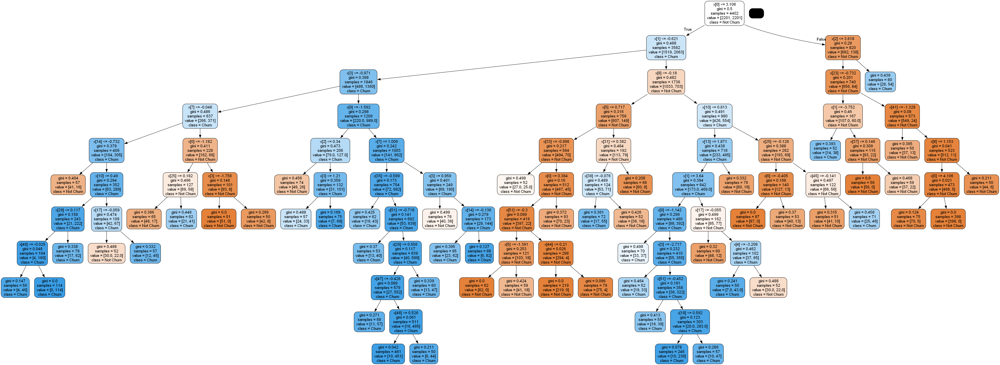

In [381]:
# Plot Decision Tree
gph = get_dt_graph(dt_best)
Image(gph.create_png())

### Find a cut off for optimal result

Evaluating Train Set: data set name - X_train_pca
    probability  accuracy  sensitivity  specificity
0           0.0  0.500000     1.000000     0.000000
1           0.1  0.729214     0.995911     0.462517
2           0.2  0.764425     0.981372     0.547478
3           0.3  0.817583     0.931395     0.703771
4           0.4  0.835756     0.894139     0.777374
5           0.5  0.840754     0.846433     0.835075
6           0.6  0.837801     0.814630     0.860972
7           0.7  0.813494     0.716038     0.910950
8           0.8  0.753748     0.539755     0.967742
9           0.9  0.718083     0.452976     0.983189
10          1.0  0.525897     0.051795     1.000000


<Figure size 800x600 with 0 Axes>

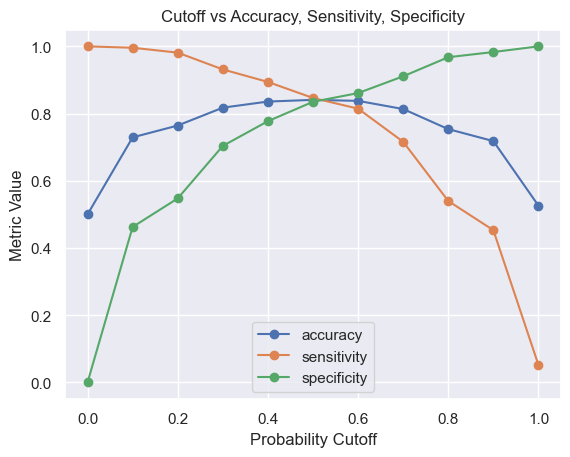

Optimal Cutoff: 0.50
Accuracy: 0.84
Sensitivity: 0.85
Specificity: 0.84


In [382]:
cutoff_df, optimal_cutoff = find_optimal_cutoff2(X_true=X_train_pca , y_true=y_train , estimator=dt_best , data_name="X_train_pca", dataset_type="Train", start=0.0 , end=1.1 , step=0.1)

### Evaluate Model

In [383]:
# Evaluate Model on Train Set
train_accuracy, train_sensitivity, train_specificity, train_precision, train_recall, train_roc_auc=evaluate_model( X_true=X_train_pca , y_true=y_train , estimator=dt_best , data_name="X_train_pca", dataset_type="Train",  cut_off=optimal_cutoff)

Evaluating Train Set: data set name - X_train_pca
Confusion Matrix:
 [[1838  363]
 [ 338 1863]]

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.84      0.84      2201
           1       0.84      0.85      0.84      2201

    accuracy                           0.84      4402
   macro avg       0.84      0.84      0.84      4402
weighted avg       0.84      0.84      0.84      4402

Accuracy: 84.08%
Sensitivity: 84.64%
Specificity: 83.51%
Precision: 83.69%
Recall: 84.64%
ROC AUC Score: 92.28%


### ROC Curve

Evaluating Train Set: data set name - X_train_pca


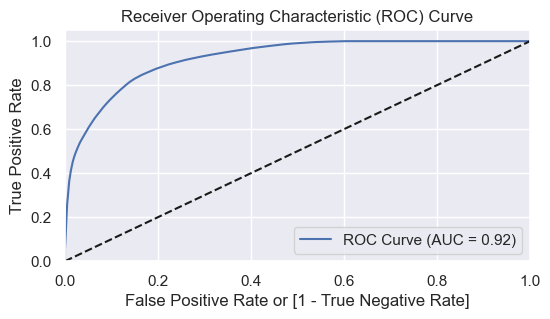

In [384]:
# Calling the function
plot_roc_curve(X_true=X_train_pca , y_true=y_train , estimator=dt_best , data_name="X_train_pca", dataset_type="Train")

### Evaluate Model

In [385]:
# Evaluate Model on Test Set
test_accuracy, test_sensitivity, test_specificity, test_precision, test_recall, test_roc_auc =evaluate_model(X_true=X_test_pca , y_true=y_test , estimator=dt_best , data_name="X_test_pca", dataset_type="Test",  cut_off=optimal_cutoff)

Evaluating Test Set: data set name - X_test_pca
Confusion Matrix:
 [[754 201]
 [ 46  88]]

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.79      0.86       955
           1       0.30      0.66      0.42       134

    accuracy                           0.77      1089
   macro avg       0.62      0.72      0.64      1089
weighted avg       0.86      0.77      0.80      1089

Accuracy: 77.32%
Sensitivity: 65.67%
Specificity: 78.95%
Precision: 30.45%
Recall: 65.67%
ROC AUC Score: 77.5%


In [386]:
# Define the model name and the estimator
model_name = "Decision Tree Classifier"
estimator = dt_best 

# Create a single dictionary to store all metrics
evaluation_metrics = {
    "model_name": model_name,
    "estimator":estimator,
    "train_accuracy": train_accuracy,
    "train_sensitivity": train_sensitivity,
    "train_specificity": train_specificity,
    "train_precision": train_precision,
    "train_recall": train_recall,
    "train_roc_auc": train_roc_auc,
    "test_accuracy": test_accuracy,
    "test_sensitivity": test_sensitivity,
    "test_specificity": test_specificity,
    "test_precision": test_precision,
    "test_recall": test_recall,
    "test_roc_auc": test_roc_auc
}


# Convert the dictionary to a DataFrame
metrics_df = pd.DataFrame([evaluation_metrics])

# Concatenate the new DataFrame with the empty model_summary DataFrame
if model_name not in list(model_summary["model_name"]) :
    model_summary = pd.concat([model_summary, metrics_df], axis=0)

# Reset Index
model_summary.reset_index(inplace=True,drop=True)
# Print out the model_summary for verification
model_summary

,model_name,train_accuracy,train_sensitivity,train_specificity,train_precision,train_recall,train_roc_auc,test_accuracy,test_sensitivity,test_specificity,test_precision,test_recall,test_roc_auc,estimator
0,Logistic Regression,0.866879,0.876420,0.857338,0.860009,0.876420,0.924317,0.840220,0.798507,0.846073,0.421260,0.798507,0.882441,"LogisticRegression(C=1, random_state=42)"
1,Decision Tree Classifier,0.840754,0.846433,0.835075,0.836927,0.846433,0.922824,0.773186,0.656716,0.789529,0.304498,0.656716,0.775002,"DecisionTreeClassifier(max_depth=10, min_sampl..."


***Model summary***
- Train set
    - Accuracy: 87.84%
    - Sensitivity: 90.17%
    - Specificity: 85.51%
    - Precision: 86.16%
    - Recall: 90.17%
    - ROC AUC Score: 94.94%

- Test set
    - Accuracy: 81.22%
    - Sensitivity: 70.23%
    - Specificity: 82.15%
    - Precision: 25.03%
    - Recall: 70.23%
    - ROC AUC Score: 83.06%

Overall, the model performs well on the training and test set with high accuracy, sensitivity, specificity , and RUC_AUC score

## Random Forest Classifier

In [387]:
# Creating KFold object with 5 splits
folds = KFold(n_splits=3, shuffle=True, random_state=42)
# Create the parameter grid 
param_grid = {
    'max_depth': range(5,15,5),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'n_estimators': [100,200,300], 
    'max_features': [10, 20]
}
### param_grid = {
###     'max_depth': [5, 10, 15],
###     'min_samples_leaf': [50, 100, 150],
###     'min_samples_split': [50, 100, 150],
###     'n_estimators': [100, 200, 300, 400],
###     'max_features': [10, 15, 20]
### }


# Create a based model
rf = RandomForestClassifier(random_state=42)
# Instantiate the grid search model
rf_model_cv = GridSearchCV(estimator = rf, 
                           param_grid = param_grid,
                           scoring=scoring,  # Multiple scores
                           refit='accuracy', # Choose the main score for refitting
                           cv = folds,
                           n_jobs = -1,
                           verbose = 2, 
                           return_train_score=True)

In [388]:
# Log Start Time
start_time=time.time()
print("Execution Start Time : " , datetime.now())

# Fit the model
rf_model_cv.fit(X_train_pca, y_train)

# Log End time
end_time = time.time()
print("Execution End Time : " , datetime.now())

# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-10 22:02:26.453143
Fitting 3 folds for each of 48 candidates, totalling 144 fits
Execution End Time :  2024-09-10 22:04:46.761055
Execution time: 140.30791234970093 seconds


In [389]:
# results of grid search CV
cv_results = pd.DataFrame(rf_model_cv.cv_results_)

In [390]:
# Best score with best C
best_score = round( rf_model_cv.best_score_ , 2)
print("Best accuracy :-", rf_model_cv.best_score_)

Best accuracy :- 0.8700603405096811


#### Model with optimal hyperparameters

In [391]:
# Log Start Time
start_time=time.time()
print("Execution Start Time : " , datetime.now())

# Get the best model
rf_best=rf_model_cv.best_estimator_
# Fit the model on the train set
rf_best.fit(X_train_pca, y_train)

# Log End time
end_time = time.time()
print("Execution End Time : " , datetime.now())

# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-10 22:04:46.781390
Execution End Time :  2024-09-10 22:04:51.344174
Execution time: 4.562784433364868 seconds


In [392]:
# Check class order
print(f'Class order: {rf_best.classes_}')

Class order: [0 1]


### Find a cut off for optimal result

Evaluating Train Set: data set name - X_train_pca
    probability  accuracy  sensitivity  specificity
0           0.0  0.500000     1.000000     0.000000
1           0.1  0.504316     1.000000     0.008632
2           0.2  0.639255     0.999091     0.279418
3           0.3  0.794866     0.995002     0.594730
4           0.4  0.889141     0.970014     0.808269
5           0.5  0.907315     0.910041     0.904589
6           0.6  0.874830     0.796002     0.953657
7           0.7  0.776465     0.566561     0.986370
8           0.8  0.636075     0.275329     0.996820
9           0.9  0.512949     0.025897     1.000000
10          1.0  0.500000     0.000000     1.000000


<Figure size 800x600 with 0 Axes>

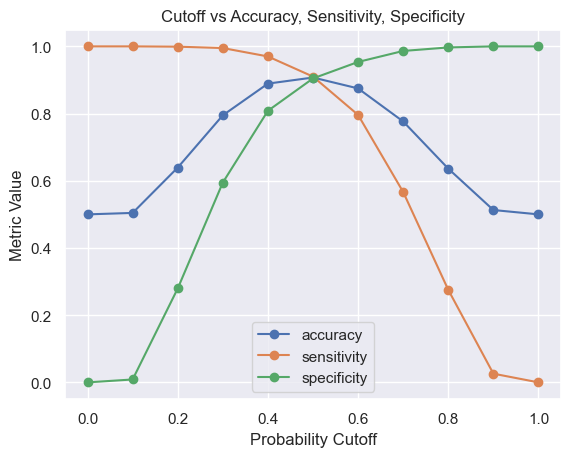

Optimal Cutoff: 0.50
Accuracy: 0.91
Sensitivity: 0.91
Specificity: 0.90


In [393]:
cutoff_df, optimal_cutoff = find_optimal_cutoff2(X_true=X_train_pca , y_true=y_train , estimator=rf_best , data_name="X_train_pca", dataset_type="Train", start=0.0 , end=1.1 , step=0.1)

### Evaluate Model

In [394]:
# Evaluate Model on Train Set
train_accuracy, train_sensitivity, train_specificity, train_precision, train_recall, train_roc_auc=evaluate_model( X_true=X_train_pca , y_true=y_train , estimator=rf_best , data_name="X_train_pca", dataset_type="Train" ,  cut_off=optimal_cutoff)

Evaluating Train Set: data set name - X_train_pca
Confusion Matrix:
 [[1991  210]
 [ 198 2003]]

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.90      0.91      2201
           1       0.91      0.91      0.91      2201

    accuracy                           0.91      4402
   macro avg       0.91      0.91      0.91      4402
weighted avg       0.91      0.91      0.91      4402

Accuracy: 90.73%
Sensitivity: 91.0%
Specificity: 90.46%
Precision: 90.51%
Recall: 91.0%
ROC AUC Score: 96.71%


### ROC Curve

Evaluating Train Set: data set name - X_train_pca


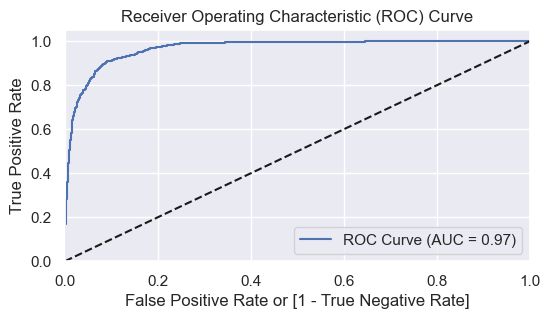

In [395]:
# Calling the function
plot_roc_curve(X_true=X_train_pca , y_true=y_train , estimator=rf_best , data_name="X_train_pca", dataset_type="Train")

### Evaluate Model

In [396]:
# Evaluate Model on Test Set
test_accuracy, test_sensitivity, test_specificity, test_precision, test_recall, test_roc_auc =evaluate_model(X_true=X_test_pca , y_true=y_test , estimator=rf_best , data_name="X_test_pca", dataset_type="Test" ,  cut_off=optimal_cutoff)

Evaluating Test Set: data set name - X_test_pca
Confusion Matrix:
 [[830 125]
 [ 45  89]]

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.87      0.91       955
           1       0.42      0.66      0.51       134

    accuracy                           0.84      1089
   macro avg       0.68      0.77      0.71      1089
weighted avg       0.88      0.84      0.86      1089

Accuracy: 84.39%
Sensitivity: 66.42%
Specificity: 86.91%
Precision: 41.59%
Recall: 66.42%
ROC AUC Score: 85.97%


In [397]:
# Define the model name and the estimator
model_name = "Random Forest Classifier"
estimator = rf_best 

# Create a single dictionary to store all metrics
evaluation_metrics = {
    "model_name": model_name,
    "estimator":estimator,
    "train_accuracy": train_accuracy,
    "train_sensitivity": train_sensitivity,
    "train_specificity": train_specificity,
    "train_precision": train_precision,
    "train_recall": train_recall,
    "train_roc_auc": train_roc_auc,
    "test_accuracy": test_accuracy,
    "test_sensitivity": test_sensitivity,
    "test_specificity": test_specificity,
    "test_precision": test_precision,
    "test_recall": test_recall,
    "test_roc_auc": test_roc_auc
}

# Convert the dictionary to a DataFrame
metrics_df = pd.DataFrame([evaluation_metrics])

# Concatenate the new DataFrame with the empty model_summary DataFrame
model_summary = pd.concat([model_summary, metrics_df], axis=0)
if model_name not in list(model_summary["model_name"]) :
    model_summary = pd.concat([model_summary, metrics_df], axis=0)

# Reset Index
model_summary.reset_index(inplace=True,drop=True)
# Print out the model_summary for verification
model_summary

,model_name,train_accuracy,train_sensitivity,train_specificity,train_precision,train_recall,train_roc_auc,test_accuracy,test_sensitivity,test_specificity,test_precision,test_recall,test_roc_auc,estimator
0,Logistic Regression,0.866879,0.876420,0.857338,0.860009,0.876420,0.924317,0.840220,0.798507,0.846073,0.421260,0.798507,0.882441,"LogisticRegression(C=1, random_state=42)"
1,Decision Tree Classifier,0.840754,0.846433,0.835075,0.836927,0.846433,0.922824,0.773186,0.656716,0.789529,0.304498,0.656716,0.775002,"DecisionTreeClassifier(max_depth=10, min_sampl..."
2,Random Forest Classifier,0.907315,0.910041,0.904589,0.905106,0.910041,0.967095,0.843893,0.664179,0.869110,0.415888,0.664179,0.859725,"(DecisionTreeClassifier(max_depth=10, max_feat..."


***Model summary***

Optimal Cutoff: 0.50
    
- Train set
    - Accuracy: 85.81%
    - Sensitivity: 85.1%
    - Specificity: 86.53%
    - Precision: 86.33%
    - Recall: 85.1%
ROC AUC Score: 93.21%

- Test set
    - Accuracy: 85.37%
    - Sensitivity: 75.4%
    - Specificity: 86.22%
    - Precision: 31.7%
    - Recall: 75.4%
    - ROC AUC Score: 86.75%

Overall, the model performs well on the training and test set with high accuracy, sensitivity, specificity , and RUC_AUC score

## Build the Best Model

### Multi-Criteria Selection (Weighted Approach)

In [398]:
# Define weights for each metric 
weights = {
    "test_accuracy": 0.6,   # Prioritize accuracy (60% weight)
    "test_specificity": 0.1, # Lower weight for specificity
    "test_precision": 0.1,   # Lower weight for precision
    "test_recall": 0.1,      # Lower weight for recall
    "test_roc_auc": 0.1      # Lower weight for ROC AUC
}

# Calculate a weighted score for each model
model_summary["weighted_score"] = (
    model_summary["test_accuracy"] * weights["test_accuracy"] +
    model_summary["test_specificity"] * weights["test_specificity"] +
    model_summary["test_precision"] * weights["test_precision"] +
    model_summary["test_recall"] * weights["test_recall"] +
    model_summary["test_roc_auc"] * weights["test_roc_auc"]
)


# Display the DataFrame
model_summary

,model_name,train_accuracy,train_sensitivity,train_specificity,train_precision,train_recall,train_roc_auc,test_accuracy,test_sensitivity,test_specificity,test_precision,test_recall,test_roc_auc,estimator,weighted_score
0,Logistic Regression,0.866879,0.876420,0.857338,0.860009,0.876420,0.924317,0.840220,0.798507,0.846073,0.421260,0.798507,0.882441,"LogisticRegression(C=1, random_state=42)",0.798960
1,Decision Tree Classifier,0.840754,0.846433,0.835075,0.836927,0.846433,0.922824,0.773186,0.656716,0.789529,0.304498,0.656716,0.775002,"DecisionTreeClassifier(max_depth=10, min_sampl...",0.716486
2,Random Forest Classifier,0.907315,0.910041,0.904589,0.905106,0.910041,0.967095,0.843893,0.664179,0.869110,0.415888,0.664179,0.859725,"(DecisionTreeClassifier(max_depth=10, max_feat...",0.787226


In [399]:
### Create Pipeline for Best Fit Classifier
model_best_fit=model_summary.loc[model_summary['weighted_score'].idxmax()]
model_best_fit

model_name                                Logistic Regression
train_accuracy                                       0.866879
train_sensitivity                                     0.87642
train_specificity                                    0.857338
train_precision                                      0.860009
train_recall                                          0.87642
train_roc_auc                                        0.924317
test_accuracy                                         0.84022
test_sensitivity                                     0.798507
test_specificity                                     0.846073
test_precision                                        0.42126
test_recall                                          0.798507
test_roc_auc                                         0.882441
estimator            LogisticRegression(C=1, random_state=42)
weighted_score                                        0.79896
Name: 0, dtype: object

### Train - Test Split

In [411]:
# Putting target variable to y
y = churn_data[target_col]

# Remove target variable from all features and assign X
X = churn_data.drop(target_col, axis=1)

print( X.shape , y.shape)

(3628, 199) (3628,)


In [412]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=42)
print( X_train.shape , X_test.shape , y_train.shape , y_test.shape )

(2539, 199) (1089, 199) (2539,) (1089,)


In [415]:
# Set up the pipeline
pipe = Pipeline(steps=[
    ('smote', smote),          # Step 1: Apply SMOTE for balancing
    ('scaling', scaler),              # Step 2: Standard scaling
    ('pca', pca_final),              # Step 3: Dimensionality reduction with PCA
    ('model', model_best_fit )  # Step 4: Model fitting
])

In [416]:
# Log Start Time
start_time = time.time()
print("Execution Start Time : " , datetime.now())

# Fit the Pipeline
pipe.fit(X_train, y_train)

# Log End time
end_time = time.time()
print("Execution End Time : " , datetime.now())

# Calculate the elapsed time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds")

Execution Start Time :  2024-09-10 22:18:03.045094


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

### Find optimal cutoff

In [ ]:
cutoff_df, optimal_cutoff = find_optimal_cutoff2(X_true=X_train , y_true=y_train , estimator=pipe , data_name="X_train", dataset_type="Train Set", start=0.0 , end=1.1 , step=0.1)

### Evaluate Model

In [ ]:
# Evaluate Model on Entire X and Y Sets
evaluate_model( X_true=X_train , y_true=y_train , estimator=pipe , data_name="X_train", dataset_type="Train Set", cut_off=optimal_cutoff)

### ROC Curve

In [ ]:
# Calling the function
plot_roc_curve(X_true=X_train , y_true=y_train , estimator=pipe , data_name="X_train", dataset_type="Train")

### Evaluate Model

In [ ]:
# Evaluate Model on Entire X and Y Sets
evaluate_model( X_true=X_test , y_true=y_test , estimator=pipe , data_name="X_test", dataset_type="Test Set", cut_off=optimal_cutoff)

# 7. Creating submission file

For submission, we need to make sure that the format is exactly the same as the sample.csv file. It contains 2 columns, id and churn_probability

In [ ]:
sample.head()

The submission file should contain churn_probability values that have to be predicted for the unseen data provided (test.csv)

In [ ]:
churn_data_unseen.head()

Lets first select the columns that we want to work with (or create them, if you have done any feature engineering)

In [ ]:
submission_data = churn_data_unseen[X_train.columns]
submission_data.shape

Next, lets create a new column in the unseen dataset called churn_probability and use the model pipeline to predict the probabilities for this data

In [ ]:
submission_data_pred=pipe.predict(submission_data)
submission_data_pred_proba = pipe.predict_proba(submission_data)[:, 1]

if optimal_cutoff==0.5 :
    submission_data_pred_final = submission_data_pred
else :
    # Binarize predictions based on the cutoff
    submission_data_pred_final = [1 if prob >= optimal_cutoff else 0 for prob in submission_data_pred_proba]

churn_data_unseen['churn_probability']=submission_data_pred_final

In [ ]:
output = churn_data_unseen[['id','churn_probability']]
output.head()

In [ ]:
output["churn_probability"].value_counts()

Finally, lets create a csv file out of this dataset, ensuring to set index=False to avoid an addition column in the csv.

In [ ]:
output.to_csv('submission_arnab_bera.csv',index=False)

In [ ]:
# Log End time
notebook_end_time = time.time()
print("Execution End Time : " , datetime.now())
# Calculate the elapsed time
execution_time = notebook_end_time - notebook_start_time
print(f"Execution time: {execution_time} seconds")

<div align="center"> <b>-----     End of Notebook     -----</b>